In [146]:
import torch
torch.set_printoptions(threshold=float('inf'))
torch.set_printoptions(sci_mode=False)
from datetime import datetime

# Copyright (c) 2023 Qualcomm Technologies, Inc.
# All Rights Reserved.

import subspectralnorm
#from bcresnet import BCResNets, PACTActivation
from torch import nn
datatype = torch.int8
cal_dtype = torch.int64
chosen_bitwidth = 8

In [147]:
import torch
import psutil

    
class CustomConv2d(nn.Module):
    def __init__(self, conv, ssn):
        """
        CustomConv2d module which fuses weights & bisases of nn.Conv2d and SubSpectralNorm
        it can infer/train with fused params
    
    :param conv: [nn.Conv2d] floating tensor to be quantized
    :param ssn: [SubSpectralNorm] quantization bit width

        """
        super().__init__()
        
        self.conv=conv
        self._conv = conv
        #self.ssn = SubSpectralNorm(num_features, spec_groups) 
        self.ssn=ssn 
        
        self.device='cuda' if torch.cuda.is_available else 'cpu'
        
        # get the info of Conv2d
        self.in_channels=conv.in_channels
        self.out_channels=conv.out_channels
        self.kernel_size=conv.kernel_size
        self.stride=conv.stride
        self.groups=conv.groups
        self.padding=conv.padding
        self.spec_groups=ssn.spec_groups 
        self.dilation=conv.dilation
        self.use_fused = False  # Default: Use the original conv until _load_and_fuse()
        

        assert self.conv.groups!=1 #the code works only for depthwise conv
        #assert self.padding==(0,0) #only for padding=0
        
        # Initialize fused parameters as learnable
        # self.weight = nn.Parameter(torch.zeros(1, self.input_plane, 1, self.kernel_size[0], self.kernel_size[1]))
        # self.bias = nn.Parameter(torch.zeros(1, self.input_plane))
        
        
    
    def forward(self, x):
        #print('input of CustomConv2d', x.shape, x[0:2])
        self.input_dim = (x.size()[0], x.size()[1], x.size()[2], x.size()[3])
        self.output_dim = (
            x.size(0), 
            self.out_channels, 
            ((x.size(2) + 2 * self.padding[0] - self.dilation[0] * (self.kernel_size[0] - 1) - 1) // self.stride[0] + 1), 
            ((x.size(3) + 2 * self.padding[1] - self.dilation[1] * (self.kernel_size[1] - 1) - 1) // self.stride[1] + 1)
        )
        
        self.device=x.device
        
        ib, ic, ih, iw = self.input_dim
        ob, oc, oh, ow = self.output_dim
        
        
        if not self.use_fused: # if it is the first time the class is called, 
            # create the fused weight & bias as learnable
            self.weight=nn.Parameter(torch.zeros(oh,ic,1,self.kernel_size[0],self.kernel_size[1], device=self.device, requires_grad=True))
            self.bias=nn.Parameter(torch.zeros(oh,ic, device=self.device, requires_grad=True))
            
            self._load_and_fuse() # _load_and_fuse only once in the beginning
            
            
        y=torch.zeros(ob, oc, oh, ow, device=self.device)
        
        # inference with fused weights and biases
        # Apply padding to the input tensor
        x_padded = F.pad(x, (self.padding[1], self.padding[1], self.padding[0], self.padding[0]))

        for h in range(oh): 
            for w in range(ow):
                h_start = h * self.stride[0]
                w_start = w * self.stride[1]

                h_end = h_start + (self.kernel_size[0] - 1) * self.dilation[0] + 1
                w_end = w_start + (self.kernel_size[1] - 1) * self.dilation[1] + 1

                # Extract the receptive field considering dilation
                receptive_field = x_padded[:, :, h_start:h_end:self.dilation[0], w_start:w_end:self.dilation[1]]

                # Perform convolution operation
                y[:, :, h:h+1, w:w+1] = F.conv2d(receptive_field, self.weight[h, :, :, :, :], bias=self.bias[h, :], groups=ic)
        #print('output of CustomConv2d', y.shape, y[0:2])
        return y
    
        
    def _load_and_fuse(self, ):
        # load Conv2d & SSN
        conv = self._conv  # Access stored conv
        ssn = self.ssn.ssnorm
        
        # get the SSN parameters
        wssn=ssn.weight.data
        bssn=ssn.bias.data
        mean=ssn.running_mean
        var=ssn.running_var
        eps=ssn.eps

        # calculate the ssn weight & bias
        # refer to https://pytorch.org/docs/stable/generated/torch.nn.BatchNorm2d.html
        std = torch.sqrt(var + eps)
        scale_factor = wssn / std
        ssn_weight=scale_factor
        ssn_bias=-mean*scale_factor +bssn
        
        # get the Conv2d parameters
        wconv=conv.weight.data #(oc, 1, kh, kw) ### only for kernel size = nx1
        wconv=wconv.squeeze() #(oc, kh)
        groups=self.spec_groups
        
        ib, ic, ih, iw = self.input_dim
        ob, oc, oh, ow = self.output_dim
        
        
        # calculate the fused weight & bias        
        ssn_weight=ssn_weight.view(oc,groups) # (oc, groups)
        ssn_bias=ssn_bias.view(oc,groups).T # (groups, oc)

        if oh // groups != 1:
            repeats = oh // groups  
            ssn_weight = ssn_weight.repeat_interleave(repeats, dim=1)
            ssn_bias = ssn_bias.repeat_interleave(repeats, dim=0)
            
        w_fused_new = torch.zeros(oh, ic, 1, self.kernel_size[0], self.kernel_size[1])
        b_fused_new=torch.zeros(oh, ic)
        # print('input dim:', self.input_dim)
        # print('output dim: ', self.output_dim)
        # print(f"wconv shape: {wconv.shape}")
        # print(f"ssn_weight shape: {ssn_weight.shape}")
        # print(f"w_fused_new shape: {w_fused_new.shape}")
        # print(f"h: {h}, c: {c}")

        for h in range(oh):
            for c in range(oc):
                w_fused_new[h, c, 0, :, 0] = wconv[c, :] * ssn_weight[c, h]

        b_fused_new=ssn_bias
        
        # Update learnable parameters
        with torch.no_grad():
            self.weight.copy_(w_fused_new.to(self.device))
            self.bias.copy_(b_fused_new.to(self.device))
        
        self.use_fused = True  # set use_fused as True, not to process _load_and_fuse twice
        self.conv = None  # Ensure original conv is not used anymore
        """
        [additional explanation, 03/04/2025, by Seoyoon]
        
        original conv should be removed and otherwise it will be included in the inference, since pyTorch RECURSIVELY explores the module.
        module CustomConv2d has conv, ssn as below
        
         (0): CustomConv2d(
                (conv): Conv2d(8, 8, kernel_size=(3, 1), stride=(2, 1), groups=8, bias=False)
                (ssn): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
              )
              
        We want to process only CustomConv2d and not conv or ssn submodules. 
        and without removing the conv inside CustomConv2d, the convolution computation will be occur twice. 
        """




In [148]:
def get_quantized_range(bitwidth):
    quantized_max = (1 << (bitwidth - 1)) - 1
    quantized_min = -(1 << (bitwidth - 1))
    return quantized_min, quantized_max

In [149]:
def linear_quantize(fp_tensor, bitwidth, scale, zero_point, dtype=datatype) -> torch.Tensor:
    """
    linear quantization for single fp_tensor
      from
        fp_tensor = (quantized_tensor - zero_point) * scale
      we have,
        quantized_tensor = int(round(fp_tensor / scale)) + zero_point
    :param tensor: [torch.(cuda.)FloatTensor] floating tensor to be quantized
    :param bitwidth: [int] quantization bit width
    :param scale: [torch.(cuda.)FloatTensor] scaling factor
    :param zero_point: [torch.(cuda.)IntTensor] the desired centroid of tensor values
    :return:
        [torch.(cuda.)FloatTensor] quantized tensor whose values are integers
    """
    assert(fp_tensor.dtype == torch.float)
    assert(isinstance(scale, float) or
           (scale.dtype == torch.float and scale.dim() == fp_tensor.dim()))
    assert(isinstance(zero_point, int) or
           (zero_point.dtype == dtype and zero_point.dim() == fp_tensor.dim()))

    # Step 1: scale the fp_tensor
    scaled_tensor = fp_tensor/scale
    #print('scaled tensor: ', scaled_tensor)
    # Step 2: round the floating value to integer value
    rounded_tensor = torch.round(scaled_tensor)

    #print('rounded_Tensor: ', rounded_tensor)
    # Step 3: shift the rounded_tensor to make zero_point 0
    shifted_tensor = rounded_tensor + zero_point
    #print('shifted_tensor: ', shifted_tensor)
    # Step 4: clamp the shifted_tensor to lie in bitwidth-bit range
    quantized_min, quantized_max = get_quantized_range(bitwidth)
    quantized_tensor = shifted_tensor.clamp_(quantized_min, quantized_max)
    #print('quantized_tensor: ', quantized_tensor)
    quantized_tensor = quantized_tensor.to(dtype)
    return quantized_tensor

In [150]:
def get_quantization_scale_and_zero_point(fp_tensor, bitwidth):
    """
    get quantization scale for single tensor
    :param fp_tensor: [torch.(cuda.)Tensor] floating tensor to be quantized
    :param bitwidth: [int] quantization bit width
    :return:
        [float] scale
        [int] zero_point
    """
    #print(fp_tensor)
    quantized_min, quantized_max = get_quantized_range(bitwidth)
    fp_max = fp_tensor.max().item()
    fp_min = fp_tensor.min().item()

    # hint: one line of code for calculating scale
    scale = (fp_max - fp_min)/(quantized_max - quantized_min)
    if scale == 0:
        scale=1e-9
    
    # hint: one line of code for calculating zero_point
    zero_point = round(quantized_min - fp_min/scale)
    # print("quantized min :", quantized_min)
    # print("quantized max :", quantized_max)
    # print("fp min :", fp_min)
    # print("fp max :", fp_max)
    # print("scale :", scale)
    # print("zero point :", zero_point)

    # clip the zero_point to fall in [quantized_min, quantized_max]
    if zero_point < quantized_min:
        zero_point = quantized_min
    elif zero_point > quantized_max:
        zero_point = quantized_max
    else: # convert from float to int using round()
        zero_point = round(zero_point)
    return scale, int(zero_point)

In [151]:
def linear_quantize_feature(fp_tensor, bitwidth, dtype): #diff
    """
    linear quantization for feature tensor
    :param fp_tensor: [torch.(cuda.)Tensor] floating feature to be quantized
    :param bitwidth: [int] quantization bit width
    :return:
        [torch.(cuda.)Tensor] quantized tensor
        [float] scale tensor
        [int] zero point
    """
    scale, zero_point = get_quantization_scale_and_zero_point(fp_tensor, bitwidth)
    quantized_tensor = linear_quantize(fp_tensor, bitwidth, scale, zero_point, dtype)
    return quantized_tensor, scale, zero_point

In [152]:
# def get_quantization_scale_for_weight(weight, bitwidth):
#     """
#     get quantization scale for single tensor of weight
#     :param weight: [torch.(cuda.)Tensor] floating weight to be quantized
#     :param bitwidth: [integer] quantization bit width
#     :return:
#         [floating scalar] scale
#     """
#     # we just assume values in weight are symmetric
#     # we also always make zero_point 0 for weight
#     fp_max = max(weight.abs().max().item(), 5e-7)
#     _, quantized_max = get_quantized_range(bitwidth)
#     return fp_max / quantized_max #scale



def _find_optimal_clip_threshold(w: torch.Tensor,
                                 bitwidth: int,
                                 num_steps: int = 100) -> float:
    """
    MSE 기반 최적 clipping threshold T* 탐색
    """
    # 1D view & CPU
    w = w.abs().view(-1).cpu()
    max_val = max(w.max().item(), 1e-8)
    thresholds = torch.linspace(max_val / num_steps, max_val, steps=num_steps)
    _, qmax = get_quantized_range(bitwidth)

    best_mse = float('inf')
    best_T = max_val

    for T in thresholds:
        w_clip = w.clamp(-T, T)
        scale = T / qmax
        w_q = (w_clip / scale).round().clamp(-qmax, qmax)
        w_deq = w_q * scale
        mse = torch.mean((w - w_deq) ** 2).item()
        if mse < best_mse:
            best_mse = mse
            best_T = T.item()

    return best_T

def get_quantization_scale_for_weight(weight: torch.Tensor,
                                      bitwidth: int,
                                      mode: str = 'mse',
                                      num_steps: int = 100) -> float:
    """
    weight tensor 하나에 대한 quantization scale 계산
    mode: 'minmax' or 'mse'
    """
    _, qmax = get_quantized_range(bitwidth)

    if mode == 'minmax':
        fp_max = max(weight.abs().max().item(), 5e-7)
        return fp_max / qmax

    elif mode == 'mse':
        w = weight.detach().cpu().view(-1)
        T_opt = _find_optimal_clip_threshold(w, bitwidth, num_steps)
        print('optimal T:', T_opt)
        return T_opt / qmax

    else:
        raise ValueError(f"Unsupported mode: {mode}")


In [153]:
def linear_quantize_weight_per_channel(tensor, bitwidth): #diff
    """
    linear quantization for weight tensor
        using different scales and zero_points for different output channels
    :param tensor: [torch.(cuda.)Tensor] floating weight to be quantized
    :param bitwidth: [int] quantization bit width
    :return:
        [torch.(cuda.)Tensor] quantized tensor
        [torch.(cuda.)Tensor] scale tensor
        [int] zero point (which is always 0)
    """
    customconv2d = (tensor.dim() != 4)

    # get the number of output channels
    dim_output_channels = 1 if customconv2d else 0
    dim_output_height = 0 if customconv2d else None
    num_output_channels = tensor.shape[dim_output_channels]
    num_output_height = tensor.shape[dim_output_height] if customconv2d else None
    
    # create array of zeros to contain scale (per channel quantization)
    scale = torch.zeros(num_output_height, num_output_channels, device=tensor.device) if customconv2d else torch.zeros(num_output_channels, device=tensor.device) 
    
    if customconv2d:
        # --- customconv2d branch ---
        OH, IC, _, KH, KW = tensor.shape

        # 1) (h, c)별 스케일 저장용
        scale = torch.zeros(OH, IC, device=tensor.device)

        # 2) height x channel 순회하며 scale 계산
        #for h in range(OH):
        for c in range(IC):
            # subtensor: shape (1, KH, KW)
            subt = tensor[:, c, 0, :, :]
            scale[:, c] = get_quantization_scale_for_weight(subt, bitwidth)
            #print('getting weight scale', subt, scale[:,c])

        # 3) (OH,IC) → (OH,IC,1,1,1) 브로드캐스트 준비
        scale = scale.view(OH, IC, 1, 1, 1)
        quantized_tensor = torch.zeros_like(tensor, dtype=datatype, device=tensor.device)
        # 4) quantize 호출
        #for h in range(OH):
        for c in range(IC):
            #print('during weight quant')
            #print("tensor", tensor[:, c:c+1, :, :, :])
            #print("scale", scale[:, c:c+1, :, :, :])
            quantized_tensor[:, c:c+1, :, :, :] = linear_quantize(tensor[:, c:c+1, :, :, :], bitwidth, scale[:, c:c+1, :, :, :], zero_point=0)
            #print("quantized_tensor", quantized_tensor[:, c:c+1, :, :, :])
        return quantized_tensor, scale, 0
        
    else: # nn.conv2d:
         # Compute Scale Factors for Each Output Channel
        for oc in range(num_output_channels):
            _subtensor = tensor.select(dim_output_channels, oc) #torch.select(input, dim, index) (=input.select(dim, index))
            _scale = get_quantization_scale_for_weight(_subtensor, bitwidth)
            scale[oc] = _scale
        
        # Reshape Scale Tensor for Broadcasting
        scale_shape = [1] * tensor.dim()
        scale_shape[dim_output_channels] = -1 # tensor (b, c, h, w) -> scale (c, 1, 1, 1)
        scale = scale.view(scale_shape)
        # Perform Quantization
        quantized_tensor = linear_quantize(tensor, bitwidth, scale, zero_point=0)
    
    return quantized_tensor, scale, 0 #zero point = 0

In [154]:

def linear_quantize_bias_per_output_channel(bias, weight_scale, input_scale, bitwidth): #diff
    """
    linear quantization for single bias tensor
        quantized_bias = fp_bias / bias_scale
    :param bias: [torch.FloatTensor] bias weight to be quantized
    :param weight_scale: [float or torch.FloatTensor] weight scale tensor
    :param input_scale: [float] input scale
    :return:
        [torch.IntTensor] quantized bias tensor
    """
    #assert(bias.dim() == 1)
    customconv2d= False #default
    if bias.dim() != 1:  #(oh, ic) 
        customconv2d = True
    assert(bias.dtype == torch.float)
    assert(isinstance(input_scale, float))
    if isinstance(weight_scale, torch.Tensor): # if customconv2d
        weight_scale = weight_scale.squeeze() # (oh, ic, 1, 1, 1) -> (oh, ic)
        assert(weight_scale.dtype == torch.float)
        assert(bias.numel() == weight_scale.numel())

    bias_scale = weight_scale * input_scale # (oh, ic) = (oh, ic) * float    
    #print("weight scale :", weight_scale, "input scale: ", input_scale)
    #print('bias scale: ', bias_scale)
    

    #print('bias: ', bias.shape, bias)
    #print("bias shape: ", bias.shape, "bias scale shape: ", bias_scale.shape)
    

        
    # print("bias shape: ", bias.shape, bias, "bias scale shape: ", bias_scale.shape)
    quantized_bias = linear_quantize(bias, 32, bias_scale,
                                     zero_point=0, dtype=torch.int32)
    #print('quantized_bias')
    #print(quantized_bias.shape, quantized_bias)
    return quantized_bias, bias_scale, 0

In [155]:
def shift_quantized_linear_bias(quantized_bias, quantized_weight, input_zero_point):
    """
    shift quantized bias to incorporate input_zero_point for nn.Linear
        shifted_quantized_bias = quantized_bias - Linear(input_zero_point, quantized_weight)
    :param quantized_bias: [torch.IntTensor] quantized bias (torch.int32)
    :param quantized_weight: [torch.CharTensor] quantized weight (datatype)
    :param input_zero_point: [int] input zero point
    :return:
        [torch.IntTensor] shifted quantized bias tensor
    """
    assert(quantized_bias.dtype == torch.int32)
    assert(isinstance(input_zero_point, int))
    return quantized_bias - quantized_weight.sum(1).to(torch.int32) * input_zero_point

In [156]:
def shift_quantized_conv2d_bias(quantized_bias, quantized_weight, input_zero_point):
    """
    Shift quantized bias to incorporate input_zero_point for nn.Conv2d (incl. custom/depthwise).
      shifted_bias = quantized_bias - input_zero_point * sum(quantized_weight)
    :param quantized_bias: torch.IntTensor, dtype=torch.int32, shape (OC,) or (OH,IC)
    :param quantized_weight: torch.IntTensor, dtype=datatype, shape
           - normal conv: (OC, IC, KH, KW)
           - custom depthwise: (OH, IC, 1, KH, KW)
    :param input_zero_point: int
    :return: torch.IntTensor, dtype=torch.int32, same shape as quantized_bias
    """
    assert quantized_bias.dtype == torch.int32
    assert isinstance(input_zero_point, int)

    # 1) weight 차원에 상관없이 입력 채널+커널 축을 합산
    if quantized_weight.dim() == 5:
        # custom conv: weight.shape = (OH, IC, 1, KH, KW)
        sum_axes = (2, 3, 4)
    elif quantized_weight.dim() == 4:
        # 일반 conv: weight.shape = (OC, IC, KH, KW)
        sum_axes = (1, 2, 3) 
    else:
        raise ValueError(f"Unsupported weight.dim(): {quantized_weight.dim()}")
    
    # sum → int32 유지
    weight_sum = quantized_weight.sum(dim=sum_axes).to(torch.int32)
    # shifted_bias 계산 (int32 유지)
    shifted_bias = quantized_bias - weight_sum * input_zero_point
    #print('quantized_weight: ', quantized_weight.shape, quantized_weight)
    #print('quantized_bias', quantized_bias.shape, quantized_bias)
    #print('input zero point', input_zero_point)
    #print('shifted bias', shifted_bias.shape, shifted_bias)
    return shifted_bias


In [157]:
def quantized_conv2d(input, weight, bias, feature_bitwidth, weight_bitwidth,
                     input_zero_point, output_zero_point,
                     input_scale, weight_scale, output_scale,
                     stride, padding, dilation, groups):
    """
    quantized 2d convolution
    :param input: [torch.CharTensor] quantized input (datatype)
    :param weight: [torch.CharTensor] quantized weight (datatype)
    :param bias: [torch.IntTensor] shifted quantized bias or None (datatype)
    :param feature_bitwidth: [int] quantization bit width of input and output
    :param weight_bitwidth: [int] quantization bit width of weight
    :param input_zero_point: [int] input zero point
    :param output_zero_point: [int] output zero point
    :param input_scale: [float] input feature scale
    :param weight_scale: [torch.FloatTensor] weight per-channel scale
    :param output_scale: [float] output feature scale
    :return:
        [torch.(cuda.)CharTensor] quantized output feature
    """
    assert(len(padding) == 4)
    
    assert(bias is None or bias.dtype == torch.int32)
    assert(isinstance(input_zero_point, int))
    assert(isinstance(output_zero_point, int))
    assert(isinstance(input_scale, float))
    assert(isinstance(output_scale, float))
    assert(weight_scale.dtype == torch.float)
   # Step 1: calculate integer-based 2d convolution (8-bit multiplication with 32-bit accumulation)
    input = torch.nn.functional.pad(input, padding, 'constant', input_zero_point)
    if 'cpu' in input.device.type:
        # use 32-b MAC for simplicity
        output = torch.nn.functional.conv2d(input.to(cal_dtype), weight.to(cal_dtype), None, stride, 0, dilation, groups)
    else:
        # current version pytorch does not yet support integer-based conv2d() on GPUs
        output = torch.nn.functional.conv2d(input.float(), weight.float(), None, stride, 0, dilation, groups)
        output = output.round().to(cal_dtype)
    if bias is not None:
        output = output + bias.view(1, -1, 1, 1)
    
    ## requantize (int32 -> int8)

    # Step 2: scale the output
    #         hint: 1. scales are floating numbers, we need to convert output to float as well
    #               2. the shape of weight scale is [oc, 1, 1, 1] while the shape of output is [batch_size, oc, height, width]
    output = output.to(torch.float)*input_scale*(weight_scale.unsqueeze(0).squeeze(-1))/output_scale
    #print(output)
    # Step 3: shift output by output_zero_point
    #         hint: one line of code
    output = output + output_zero_point
    # Make sure all value lies in the bitwidth-bit range
    output = output.round().clamp(*get_quantized_range(chosen_bitwidth)).to(datatype)
    
    

    return output

In [158]:
def quantized_linear(input, weight, bias, feature_bitwidth, weight_bitwidth,
                     input_zero_point, output_zero_point,
                     input_scale, weight_scale, output_scale):
    """
    quantized fully-connected layer
    :param input: [torch.CharTensor] quantized input (torch.int32)
    :param weight: [torch.CharTensor] quantized weight (torch.int32)
    :param bias: [torch.IntTensor] shifted quantized bias or None (torch.int32)
    :param feature_bitwidth: [int] quantization bit width of input and output
    :param weight_bitwidth: [int] quantization bit width of weight
    :param input_zero_point: [int] input zero point
    :param output_zero_point: [int] output zero point
    :param input_scale: [float] input feature scale
    :param weight_scale: [torch.FloatTensor] weight per-channel scale
    :param output_scale: [float] output feature scale
    :return:
        [torch.CharIntTensor] quantized output feature (torch.int32)
    """
    assert(input.dtype == datatype)
    assert(weight.dtype == input.dtype)
    assert(bias is None or bias.dtype == torch.int32)
    assert(isinstance(input_zero_point, int))
    assert(isinstance(output_zero_point, int))
    assert(isinstance(input_scale, float))
    assert(isinstance(output_scale, float))
    assert(weight_scale.dtype == torch.float)

    # Step 1: integer-based fully-connected (8-bit multiplication with 32-bit accumulation)
    if 'cpu' in input.device.type:
        # use 32-b MAC for simplicity
        output = torch.nn.functional.linear(input.to(torch.int32), weight.to(torch.int32), bias)
    else:
        # current version pytorch does not yet support integer-based linear() on GPUs
        output = torch.nn.functional.linear(input.float(), weight.float(), bias.float())

    # Step 2: scale the output
    output = output.to(torch.float)*input_scale*weight_scale.squeeze()/output_scale

    # Step 3: shift output by output_zero_point
    output = output + output_zero_point

    # Make sure all value lies in the bitwidth-bit range
    output = output.round().clamp(*get_quantized_range(feature_bitwidth)).to(datatype)
    return output

In [159]:
def fuse_conv_bn(conv, bn):
    # Ensure the conv is a 2D convolution
    assert isinstance(conv, nn.Conv2d) and isinstance(bn, nn.BatchNorm2d), "conv must be Conv2d and bn must be BatchNorm2d"
    device = conv.weight.device
    bn.weight.data = bn.weight.data.to(device)
    bn.bias.data = bn.bias.data.to(device)  
    
    # Compute scaling factor for weights
    factor = bn.weight.data / torch.sqrt(bn.running_var.data + bn.eps)
    
    if conv.groups != 1:  # Depthwise convolution case
        factor = factor.reshape(conv.out_channels, 1, 1, 1)  # Match depthwise conv weight shape
    else:  # Standard convolution case
        factor = factor.reshape(-1, 1, 1, 1)  # Match normal conv weight shape

    conv.weight.data *= factor  # Scale weights

    # Compute new bias
    if conv.bias is not None:
        conv.bias.data = (conv.bias.data - bn.running_mean.data) * factor.flatten() + bn.bias.data
    else:
        conv.bias = nn.Parameter(-bn.running_mean.data * factor.flatten() + bn.bias.data)
    
    return conv



def fuse_bn_conv(bn: nn.BatchNorm2d, conv: nn.Conv2d):

    wbn=bn.weight.data
    bbn=bn.bias.data
    mean=bn.running_mean
    var=bn.running_var
    eps=bn.eps

    std = torch.sqrt(var + eps)
    scale_factor = wbn / std
    bn_weight=scale_factor
    bn_bias=-mean*scale_factor +bbn

    conv_weight=conv.weight.data.squeeze()
    conv_bias=conv.bias.data
    
    total_weight=(conv_weight*bn_weight.unsqueeze(1).T).unsqueeze(2).unsqueeze(2)
    total_bias=conv_weight@bn_bias+conv_bias

    # Update Conv weights: Scale along input channel axis
    conv.weight.data = nn.Parameter(total_weight)

    # Update Conv bias
    conv.bias = nn.Parameter(total_bias)

    return conv
    


def fuse_conv_ssn(conv: nn.Conv2d, ssn: nn.BatchNorm2d):
    """Fuses a Conv2D layer with a SubSpectralNorm layer for quantization."""
    #if not isinstance(conv, nn.Conv2d) or not isinstance(ssn, SubSpectralNorm):
    #    raise ValueError("Inputs must be a Conv2d layer and a SubSpectralNorm layer")

    # Create instance of CustomConv2d
    fused_layer = CustomConv2d(conv, ssn)    
    
    return fused_layer


In [160]:
import torch.nn as nn
import torch
import copy
def get_next_layer(input_model, current_layer_name, found=False):
    """
    Recursively searches for the next layer in the input_model hierarchy.
    Handles nested nn.Sequential and other module containers.
    """
    children = list(input_model.named_children())  # Get ordered list of layers

    for idx, (name, module) in enumerate(children):
        full_name = name if not found else None

        if found:  # Return the first layer after the matched layer
            return name, module

        if name == current_layer_name:
            found = True  # Mark when we find the current layer

        # If the module is an nn.Sequential, search inside it recursively
        if isinstance(module, nn.Sequential):
            for sub_name, sub_module in module.named_children():
                full_sub_name = f"{name}.{sub_name}"
                if found:
                    return full_sub_name, sub_module  # Found next layer inside Sequential
                if full_sub_name == current_layer_name:
                    found = True

    return None, None  # If no next layer is found




# Recursive function to fuse conv+bn, bn+conv, conv+ssn
def fuse_module(input_model, parent_name=""):
    """
    Recursively explores the input_model and replaces 
        Conv2d + BN -> Conv2d
        Conv2d + SSN -> CustomConv2d
        BN + Conv2d -> Conv2d
    """
    if isinstance(input_model, nn.Module):
        children_copy = list(input_model.named_children())  # Copy of children list to avoid modifying while iterating
        for child_name, child in children_copy:
            full_name = f"{parent_name}.{child_name}" if parent_name else child_name
            # Recursively replace in sub-modules
            fuse_module(child, full_name)
            
            if isinstance(child, nn.Conv2d):
                next_layer_name, next_layer = get_next_layer(input_model, child_name)
                # Check if Conv2d is followed by BatchNorm2d in the same module
                if isinstance(next_layer, nn.BatchNorm2d):
                    input_model._modules[child_name]=fuse_conv_bn(child, next_layer)
                    del input_model._modules[next_layer_name]
                    print(f'fused Conv2d + BN at layer: {full_name}')
                
                # Check if Conv2d is followed by SubSpectralNorm in the same module    
                elif isinstance(next_layer, subspectralnorm.SubSpectralNorm):
                    input_model._modules[child_name]=fuse_conv_ssn(child, next_layer)
                    del input_model._modules[next_layer_name]
                    print(f'fused Conv2d + SSN at layer: {full_name}')
                
            elif isinstance(child, nn.BatchNorm2d):
                next_layer_name, next_layer = get_next_layer(input_model, child_name)
                
                # Check if BN2d is collowed by Conv2d in the same module
                if isinstance(next_layer, nn.Conv2d):
                    input_model._modules[child_name]=fuse_bn_conv(child, next_layer)
                    del input_model._modules[next_layer_name]
                    print(f'fused BN + Conv2d  at layer: {full_name}')
            
        return input_model
    return input_model


In [161]:
def add_range_recoder_hook(model):
    import functools
    def _record_range(self, x, y, module_name):
        x = x[0] #extract the first input tensor (since input is a tuple)
        input_activation[module_name] = x.detach() #without gradient tracking
        output_activation[module_name] = y.detach()

    all_hooks = []
    for name, m in model.named_modules():
        if isinstance(m, (nn.Conv2d, nn.Linear, nn.ReLU, nn.SiLU, nn.ReLU6, nn.AdaptiveAvgPool2d, CustomConv2d, nn.AvgPool2d, nn.MaxPool2d)):
            all_hooks.append(m.register_forward_hook(
                functools.partial(_record_range, module_name=name))) #append _record_range(module_name=name) to the all_hooks list
    return all_hooks

def get_activation_range():

    hooks = add_range_recoder_hook(fused_model)
    #labels = torch.load('label_input_40,101.pt')[0]
    #inputs = torch.load('val_data.pt')[1]
    inputs = torch.load('val_loader.pt')['inputs']
    #inputs = torch.load('label_input_40,101.pt')[1]
    
    sample_data = inputs
    #sample_data=sample_data = iter(dataloader['train']).__next__()[0] #get the first batch of the training data for VGG model (without label) 

    batch_size = 512
    sample_data = sample_data.cuda()  # Move full data to GPU (if enough memory) or do it per batch

    ## to update : get the random 512 samples from sample_data

    for i in range(0, sample_data.shape[0], batch_size):
        batch = sample_data[i:i+batch_size]  # Extract a batch of size 400
        output = fused_model(batch)  # Forward pass
        del batch  # Free memory after processing each batch (to avoid memory issues)
        torch.cuda.empty_cache()  # Clear cache to reduce memory usage
        
    for name, x in input_activation.items():
        print(f'{name} input activation range: [{x.min().item():.2f}, {x.max().item():.2f}]')

    for name, x in output_activation.items():
        print(f'{name} output activation range: [{x.min().item():.2f}, {x.max().item():.2f}]')
    # remove hooks
    for h in hooks:
        h.remove()
        
    return input_activation, output_activation


In [162]:
"""
    Quantized modules including
        - QuantizedConv2d
        - QuantizedLinear
        - QuantizedMaxPool2d
        - QuantizedAvgPool2d
        - QuantizedCustomConv2d
"""
class QuantizedConv2d(nn.Module):
    def __init__(self, weight, bias,
                 input_zero_point, output_zero_point,
                 input_scale, weight_scale, output_scale,
                 stride, padding, dilation, groups,
                 feature_bitwidth, weight_bitwidth):
        super().__init__()
        # current version Pytorch does not support IntTensor as register_buffer
        self.register_buffer('weight', weight)
        self.register_buffer('bias', bias)

        self.input_zero_point = input_zero_point
        self.output_zero_point = output_zero_point

        self.input_scale = input_scale
        self.register_buffer('weight_scale', weight_scale)
        self.output_scale = output_scale

        self.stride = stride
        self.padding = (padding[1], padding[1], padding[0], padding[0])
        self.dilation = dilation
        self.groups = groups

        self.feature_bitwidth = feature_bitwidth
        self.weight_bitwidth = weight_bitwidth


    def forward(self, x):
        #print("input of quantized conv2d: ",x.shape, x)
        return quantized_conv2d(
            x, self.weight, self.bias,
            self.feature_bitwidth, self.weight_bitwidth,
            self.input_zero_point, self.output_zero_point,
            self.input_scale, self.weight_scale, self.output_scale,
            self.stride, self.padding, self.dilation, self.groups
            )

class QuantizedLinear(nn.Module):
    def __init__(self, weight, bias,
                 input_zero_point, output_zero_point,
                 input_scale, weight_scale, output_scale,
                 feature_bitwidth, weight_bitwidth):
        super().__init__()
        # current version Pytorch does not support IntTensor as register_buffer
        self.register_buffer('weight', weight)
        self.register_buffer('bias', bias)

        self.input_zero_point = input_zero_point
        self.output_zero_point = output_zero_point

        self.input_scale = input_scale
        self.register_buffer('weight_scale', weight_scale)
        self.output_scale = output_scale

        self.feature_bitwidth = feature_bitwidth
        self.weight_bitwidth = weight_bitwidth

    def forward(self, x):
        return quantized_linear(
            x, self.weight, self.bias,
            self.feature_bitwidth, self.weight_bitwidth,
            self.input_zero_point, self.output_zero_point,
            self.input_scale, self.weight_scale, self.output_scale
            )

class QuantizedMaxPool2d(nn.Module):
    def __init__(self, kernel_size, scale, zero_point):
        super().__init__()
        self.kernel_size = kernel_size
        self.scale = scale
        self.zero_point = zero_point

    def forward(self, x_q):
        # 1) dequantize
        x_f = (x_q.to(torch.int32) - self.zero_point).float() * self.scale
        # 2) float 공간에서 풀링
        y_f = F.max_pool2d(x_f, self.kernel_size)
        # 3) re-quantize
        y_q = torch.round(y_f / self.scale) + self.zero_point
        # 4) clamp & dtype 변환
        qmin, qmax = -32768, 32767     # bitwidth=16 예시
        y_q = torch.clamp(y_q, qmin, qmax).to(x_q.dtype)
        return y_q

class QuantizedAvgPool2d(nn.Module):
    def __init__(self, kernel_size, scale, zero_point):
        super().__init__()
        self.kernel_size = kernel_size
        self.scale = scale
        self.zero_point = zero_point

    def forward(self, x_q):
        x_f = (x_q.to(torch.int32) - self.zero_point).float() * self.scale
        y_f = F.avg_pool2d(x_f, self.kernel_size)  # 평균 풀링
        y_q = torch.round(y_f / self.scale) + self.zero_point
        qmin, qmax = -32768, 32767
        y_q = torch.clamp(y_q, qmin, qmax).to(x_q.dtype)
        return y_q
 
    
class QuantizedAdaptiveAvgPool2d(nn.Module):
    def __init__(self, output_size,
                 input_scale, input_zero_point,
                 output_scale=None, output_zero_point=None):
        super().__init__()
        self.output_size      = output_size
        self.input_scale      = input_scale
        self.input_zero_point = input_zero_point
        # if you want to keep the same scale on output you can default these
        self.output_scale      = output_scale      or input_scale
        self.output_zero_point = output_zero_point or input_zero_point

    def forward(self, x_int8):
        # 1) Dequantize
        x_fp32 = (x_int8.float() - self.input_zero_point) * self.input_scale

        # 2) Pool in FP32
        pooled_fp32 = F.adaptive_avg_pool2d(x_fp32, self.output_size)

        # 3) Requantize
        # Option A: manual
        q = torch.round(pooled_fp32 / self.output_scale) \
            + self.output_zero_point
        qmin, qmax = get_quantized_range(chosen_bitwidth)
        q = torch.clamp(q, qmin, qmax)
        q = q.to(torch.int8)
        return q

    

class QuantizedSiLU(nn.Module):
    def __init__(self,
                 input_scale: float,
                 input_zero_point: int,
                 bitwidth: int = 8,
                 signed: bool = True,
                 output_scale: float = None,
                 output_zero_point: int = None,
                 quant_dtype=torch.int8):
        """
        Args:
          input_scale, input_zero_point:  입력 x_int → fp32 로 변환할 때 쓸 파라미터
          bitwidth, signed:               출력 quantization 비트폭/부호 여부
          output_scale/zero_point:        출력 fp32 → quantize 할 때 사용할 파라미터
                                          생략 시 input_scale/zero_point 사용
          quant_dtype:                    출력 dtype (torch.int8, torch.int16 등)
        """
        super().__init__()
        self.in_scale  = input_scale
        self.in_zp     = input_zero_point
        self.bitwidth  = bitwidth
        self.signed    = signed
        self.quant_dtype = quant_dtype

        # 출력 스케일·제로포인트: 지정되지 않으면 입력과 동일하게
        self.out_scale = output_scale      or input_scale
        self.out_zp    = output_zero_point or input_zero_point

        # quant clamp 범위 미리 계산
        self.qmin, self.qmax = get_quantized_range(bitwidth, signed)

    def forward(self, x_int):
        # 1) Dequantize: int → float
        x_fp = (x_int.to(torch.int32).float() - self.in_zp) * self.in_scale

        # 2) SiLU (FP32)
        y_fp = F.silu(x_fp)

        # 3) Requantize: float → int
        #   (y_fp / scale) → round → add zp → clamp → dtype
        y_q = torch.round(y_fp / self.out_scale) + self.out_zp
        y_q = torch.clamp(y_q, self.qmin, self.qmax).to(self.quant_dtype)

        return y_q


class QuantizedCustomConv2d(nn.Module):
    def __init__(self, conv, ssn, weight, bias,
                 input_zero_point, output_zero_point,
                 input_scale, weight_scale, output_scale,
                 feature_bitwidth, weight_bitwidth):
        super().__init__()
        
        #self.ssn = ssn.ssnorm
        self.device = 'cuda' if torch.cuda.is_available() else 'cpu'
        
        # Extract convolution properties
        self.input_plane = conv.in_channels
        self.output_plane = conv.out_channels
        self.kernel_size = conv.kernel_size
        self.quantized_weight= weight.to(datatype).to(self.device)
        self.quantized_bias=bias.to(torch.int32).to(self.device)
        
        self.input_zero_point = input_zero_point
        self.output_zero_point = output_zero_point
        
        self.input_scale = input_scale
        self.register_buffer('weight_scale', weight_scale)
        self.output_scale = output_scale
        
        self.stride = conv.stride
        self.groups = conv.groups
        self.padding = conv.padding
        self.dilation=conv.dilation
        
        self.spec_groups = ssn.spec_groups  

        self.feature_bitwidth = feature_bitwidth
        self.weight_bitwidth = weight_bitwidth
        
        self.use_fused = False  
        
        # Create quantized&fused weights & biases
        self.register_buffer('weight', self.quantized_weight)
        self.register_buffer('bias', self.quantized_bias)
        #print('quantizedcustomconv2d self.weight and bias')
        #print(self.weight)
        #print(self.bias)
        
        assert self.groups!=1 #the code works only for depthwise conv
        assert self.kernel_size[1] == 1 #only for 1d Conv
        scale_shape = self.weight_scale.shape
        self.scale = self.input_scale*(self.weight_scale.squeeze())/self.output_scale
        self.scale = self.scale.view(scale_shape[0], scale_shape[1], 1, 1, 1) # (oh, ic) -> (oh, ic, 1, 1, 1)
        
    def forward(self, x):
        
        x = x.to(self.device)
        self.input_dim = x.size()
        
        self.output_dim = (
            x.size(0), 
            self.output_plane, 
            ((x.size(2) + 2 * self.padding[0] - self.dilation[0] * (self.kernel_size[0] - 1) - 1) // self.stride[0] + 1), 
            ((x.size(3) + 2 * self.padding[1] - self.dilation[1] * (self.kernel_size[1] - 1) - 1) // self.stride[1] + 1)
        )
        ib, ic, ih, iw = self.input_dim
        ob, oc, oh, ow = self.output_dim
        kh, kw = self.kernel_size
        sh, sw = self.stride
        dh, dw = self.dilation
      
            
        y = torch.zeros(ob, oc, oh, ow, device=self.device, dtype=torch.float32)
        
        x_padded = F.pad(x.to(torch.float32), (self.padding[1], self.padding[1], self.padding[0], self.padding[0]), 'constant', self.input_zero_point)
        for h in range(oh): 
            for w in range(ow):
                h_start = h * self.stride[0]
                w_start = w * self.stride[1]

                h_end = h_start + (self.kernel_size[0] - 1) * self.dilation[0] + 1
                w_end = w_start + (self.kernel_size[1] - 1) * self.dilation[1] + 1

                # Extract the receptive field considering dilation
                receptive_field = x_padded[:, :, h_start:h_end:self.dilation[0], w_start:w_end:self.dilation[1]]
                
                # weight shape: (oh, ic, 1, kh, kw)
                # bias shape : (oh, ic)
                # receptive_field shape: (b, ic, kh, kw)
                # Perform convolution operation
                y[:, :, h:h+1, w:w+1] = F.conv2d(receptive_field, self.weight[h, :, :, :, :].to(torch.float32), bias=self.bias[h, :].to(torch.float32), groups=ic)
                
        y=y.to(cal_dtype)    
        scale_2d = self.scale.squeeze(-1).squeeze(-1).squeeze(-1)  # shape: (H, C)
        scale_bc = scale_2d.permute(1, 0).unsqueeze(0).unsqueeze(-1) # shape (1, C, H, 1)

        y=y.to(torch.float32)*scale_bc+self.output_zero_point
        y = y.round().clamp(*get_quantized_range(self.feature_bitwidth)).to(datatype)
        #print("output of custom conv2d: ", y.shape, y[0])
        return y

class QuantizedCustomReLU(nn.Module):
    def __init__(self,
                 input_scale: float,
                 input_zero_point: int,
                 output_scale: float = None,
                 output_zero_point: int = None):
        super().__init__()
        self.in_s = input_scale
        self.in_z = input_zero_point
        # 보통 ReLU 후엔 같은 스케일/제로포인트를 재사용
        self.out_s = output_scale      or input_scale
        self.out_z = output_zero_point or input_zero_point

    def forward(self, x_int8: torch.Tensor) -> torch.Tensor:
        # 1) dequant
        x_fp32 = (x_int8.float() - self.in_z) * self.in_s
        
        # 2) relu
        y_fp32 = torch.clamp(x_fp32, min=0.0)
        # 3) requant (manual)
        y_q = torch.round(y_fp32 / self.out_s) + self.out_z
        y_q = torch.clamp(y_q, -(2**chosen_bitwidth), (2**(chosen_bitwidth)-1)).to(datatype)
        #print("output of custom relu: ", y_q.shape, y_q[0])
        #torch.save(y_q, f'output_relu_{datetime.now().strftime("%B%d_%H%M%S")}.pt')
        return y_q


In [163]:

def get_quantized_weight_scale_zeropoint(input_activation, output_activation, weight, bias, feature_bitwidth, weight_bitwidth, layer_type=None, spec_group=None):
    """
    get the input/output activation range
    - return input/output scale and zero point
    - return weight scale
    - return quantized weight and bias

    Args:
        input_activation (dictionary): range of input activation
        output_activation (dictionary): range of output activation
        weight (torch.tensor): values of weight 
        bias (torch.tensor): values of bias
        feature_bitwidth (int, optional): bitwidth for input/output feature. Defaults to 8.
        weight_bitwidth (int, optional): bitwidth for weight. Defaults to 8.
        oh (int, optional):for CustomConv2d. Defaults to None.
        spec_group (int, optional): for CustomConv2d. Defaults to None.
        customconv2d (bool, optional): if the module is CustomConv2d or not. Defaults to False.

    Returns:
        _type_: _description_
    """
    # Fetch activation stats
    input_scale, input_zero_point = get_quantization_scale_and_zero_point(
        input_activation, feature_bitwidth)
    output_scale, output_zero_point = get_quantization_scale_and_zero_point(
            output_activation, feature_bitwidth)
    #print("before quant, weight", weight.shape, weight)
    print(layer_type)
    
    if layer_type == 'conv2d' or layer_type == 'customconv2d':
    # Quantize weights and bias
        quantized_weight, weight_scale, weight_zero_point = \
            linear_quantize_weight_per_channel(weight, weight_bitwidth)
        quantized_bias, bias_scale, bias_zero_point = \
            linear_quantize_bias_per_output_channel(
                bias, weight_scale, input_scale, bitwidth = 32) if bias is not None else (None, None, None)
        
    
        shifted_quantized_bias = shift_quantized_conv2d_bias(
        quantized_bias, quantized_weight, input_zero_point) if quantized_bias is not None else None
    
    elif layer_type == 'linear': 
        quantized_weight, weight_scale, weight_zero_point = linear_quantize_feature(weight, weight_bitwidth, torch.int8)
        quantized_bias, bias_scale, bias_zero_point = linear_quantize_feature(bias, 32, torch.int32)
        shifted_quantized_bias = shift_quantized_linear_bias(
        quantized_bias, quantized_weight, input_zero_point) if quantized_bias is not None else None   
    weight_scale = (weight_scale if isinstance(weight_scale, torch.Tensor) else torch.tensor(weight_scale))
    return quantized_weight, shifted_quantized_bias, input_scale, input_zero_point, output_scale, output_zero_point, weight_scale


In [164]:
import torch
import torch.nn as nn

# Recursive function to replace Conv2d followed by ReLU6 with QuantizedConv2d
def recursively_quantize_module(model, input_activation, output_activation, parent_name=""):
    """
    Recursively explores the model and replaces Conv2d followed by ReLU6
    with a QuantizedConv2d.
    """
    if isinstance(model, nn.Module):
        for child_name, child in model.named_children():
            # print(f"Processing child: {child_name, child} of parent: {parent_name}")
            # print(type(child))                 # ← 모델 안 PACTActivation 의 실제 클래스
            # print(PACTActivation)              # ← 현재 스크립트가 들고 있는 클래스
            # print(child.__class__ is PACTActivation)  # True 여야 isinstance 가 먹힘
            # print(child.__class__.__module__)  # 서로 다른 모듈·경로면 다른 클래스
            full_name = f"{parent_name}.{child_name}" if parent_name else child_name
            # Recursively replace in sub-modules
            model._modules[child_name] = recursively_quantize_module(child, input_activation, output_activation, full_name)
            
            if isinstance(child, nn.Conv2d):
                # Construct the activation keys correctly based on the layer name structure
                activation_key = f"{full_name}"  # Use child_name to get the correct key
                print(f"Looking up input_activation for layer: {activation_key}")
                
                if activation_key not in input_activation:
                    print(f"Key '{activation_key}' not found in input_activation")
                    continue
                feature_bitwidth = weight_bitwidth = chosen_bitwidth
                weight = child.weight.data
                bias = child.bias.data if child.bias is not None else None
                quantized_weight, shifted_quantized_bias, input_scale, input_zero_point, output_scale, output_zero_point, weight_scale=\
                get_quantized_weight_scale_zeropoint(
                input_activation[activation_key],   # 1
                output_activation[full_name],       # 2
                weight,                             # 3
                bias,                               # 4
                feature_bitwidth,                   # 5
                weight_bitwidth,                    # 6
                'conv2d',                           # 7 → layer_type
                None                         # 9 → spec_group
            )
                stride = child.stride
                padding = child.padding
                dilation = child.dilation
                groups = child.groups
                
                # Replace Conv2d with QuantizedConv2d
                model._modules[child_name] = QuantizedConv2d(quantized_weight, shifted_quantized_bias, input_zero_point, output_zero_point,
                                                        input_scale, weight_scale, output_scale,
                                                        stride, padding, dilation, groups, 
                                                        feature_bitwidth, weight_bitwidth)
                
                print(f'Replaced Conv2d with QuantizedConv2d at layer: {full_name}')
                #print(f"quantized with weight scale: {weight_scale}, input scale: {input_scale}, output scale: {output_scale}")
                #print(f'quantized with input zero point: {input_zero_point}, output zero point: {output_zero_point}')
                #print(f'quantized_conv2d_weight: {quantized_weight}, shifted_quantized_bias: {shifted_quantized_bias}')
                
                    
            elif isinstance(child, CustomConv2d):
                activation_key = f"{full_name}"  # Use child_name to get the correct key
                print(f"Looking up input_activation for layer: {activation_key}")
                
                if activation_key not in input_activation:
                    print(f"Key '{activation_key}' not found in input_activation")
                    continue
                feature_bitwidth = weight_bitwidth = chosen_bitwidth
                
                oh=child.output_dim[2]
                spec_groups=child.spec_groups
                
                weight=child.weight.data
                bias = child.bias.data 
                
                quantized_weight, shifted_quantized_bias, input_scale, input_zero_point, output_scale, output_zero_point, weight_scale=\
                get_quantized_weight_scale_zeropoint(
                input_activation[activation_key],   # 1
                output_activation[full_name],       # 2
                weight,                             # 3
                bias,                               # 4
                feature_bitwidth,                   # 5
                weight_bitwidth,                    # 6
                'customconv2d',                           # 7 → layer_type
                spec_groups                         # 9 → spec_group
            )
                conv=child._conv
                ssn=child.ssn
                print("weight scale shape", weight_scale.shape)
                model._modules[child_name] = QuantizedCustomConv2d(conv, ssn, quantized_weight, shifted_quantized_bias,
                 input_zero_point, output_zero_point,
                 input_scale, weight_scale, output_scale,
                 feature_bitwidth, weight_bitwidth)
                print(f'Replaced CustomConv2d with QuantizedCustomConv2d at layer: {full_name}')
                
            elif isinstance(child, nn.AdaptiveAvgPool2d):
                child_index = list(model.children()).index(child)
                # Construct the activation keys correctly based on the layer name structure
                activation_key = f"{full_name}"  # Use child_name to get the correct key
                print(f"Looking up input_activation for layer: {activation_key}")
                
                if activation_key not in input_activation:
                    print(f"Key '{activation_key}' not found in input_activation")
                    continue
                
                feature_bitwidth = weight_bitwidth = chosen_bitwidth
                
                input_scale, input_zero_point = get_quantization_scale_and_zero_point(
                input_activation[activation_key], feature_bitwidth)
                output_scale, output_zero_point = get_quantization_scale_and_zero_point(
                    output_activation[full_name], feature_bitwidth)
                model._modules[child_name] = QuantizedAdaptiveAvgPool2d(child.output_size, input_scale, input_zero_point, output_scale, output_zero_point)                
        
        
                print(f'Replaced nn.AdaptiveAvgPool2d with QuantizedAvgPool2d at layer: {full_name}')
                
            elif isinstance(child, nn.AvgPool2d):
                model._modules[child_name] = QuantizedAvgPool2d(child.kernel_size)
                print(f'Replaced nn.AvgPool2d with QuantizedAvgPool2d at layer: {full_name}')
                
                
            elif isinstance(child, nn.MaxPool2d):
                model._modules[child_name] = QuantizedMaxPool2d(child.kernel_size)
                print(f'Replaced nn.MaxPool2d with QuantizedMaxPool2d at layer: {full_name}')
                
            elif isinstance(child, nn.Linear):
                # Construct the activation keys correctly based on the layer name structure
                activation_key = f"{full_name}"  # Use child_name to get the correct key
                print(f"Looking up input_activation for layer: {activation_key}")
                
                if activation_key not in input_activation:
                    print(f"Key '{activation_key}' not found in input_activation")
                    continue
                weight=child.weight.data
                bias = child.bias.data 
                feature_bitwidth = weight_bitwidth = chosen_bitwidth
                quantized_weight, shifted_quantized_bias, input_scale, input_zero_point, output_scale, output_zero_point, weight_scale=\
                get_quantized_weight_scale_zeropoint(
                input_activation[activation_key],   # 1
                output_activation[full_name],       # 2
                weight,                             # 3
                bias,                               # 4
                feature_bitwidth,                   # 5
                weight_bitwidth,                    # 6
                'linear',                           # 7 → layer_type
                None                         # 9 → spec_group
            )
                model._modules[child_name] = QuantizedLinear(quantized_weight, shifted_quantized_bias,
                 input_zero_point, output_zero_point,
                 input_scale, weight_scale, output_scale,
                 feature_bitwidth, weight_bitwidth)
                print(f'Replaced nn.Linear with QuantizedLinear at layer: {full_name}')

            
            elif isinstance(child, nn.ReLU) or isinstance(child, nn.SiLU) or isinstance(child, nn.ReLU6):
                activation_key = f"{full_name}"  # Use child_name to get the correct key
                print(f"Looking up input_activation for layer: {activation_key}")
                
                if activation_key not in input_activation:
                    print(f"Key '{activation_key}' not found in input_activation")
                    continue
                input_scale, input_zero_point = get_quantization_scale_and_zero_point(input_activation[activation_key], bitwidth=chosen_bitwidth)
                output_scale, output_zero_point = get_quantization_scale_and_zero_point(
                    output_activation[full_name], bitwidth=chosen_bitwidth)
                model._modules[child_name] = QuantizedCustomReLU(input_scale, input_zero_point, output_scale, output_zero_point)
        
                print(f'Replaced nn.ReLU with QuantizedcustomReLU at layer: {full_name}')
        
            elif isinstance(child, PACTActivation):
                activation_key = f"{full_name}"  # Use child_name to get the correct key
                print(f"Looking up input_activation for layer: {activation_key}")
                
                if activation_key not in input_activation:
                    print(f"Key '{activation_key}' not found in input_activation")
                    continue
                input_scale, input_zero_point = get_quantization_scale_and_zero_point(input_activation[activation_key], bitwidth=chosen_bitwidth)
                output_scale, output_zero_point = get_quantization_scale_and_zero_point(
                    output_activation[full_name], bitwidth=chosen_bitwidth)
                model._modules[child_name] = QuantizedCustomReLU(input_scale, input_zero_point, output_scale, output_zero_point)
                print(f'Replaced PACTActivation with QuantizedcustomReLU at layer: {full_name}')
            elif isinstance(child, (nn.Sequential, nn.ModuleList)):
                recursively_quantize_module(child, input_activation, output_activation, full_name)
            # Handle ModuleList or Sequential sub-modules
                
                    
        return model
    return model

def init_quantized_model(fused_model, input_activation, output_activation):
    # Deepcopy the model before modifying
    quantized_model = copy.deepcopy(fused_model)

    #you have to manually set the bitwidth for each layer
    
    # Update the model
    quantized_model = recursively_quantize_module(quantized_model, input_activation, output_activation)

    return quantized_model




In [165]:
def linear_quantize_with_predefined_range(feature, feature_record, bitwidth, dtype=datatype):
    quantized_min, quantized_max = get_quantized_range(bitwidth)
    fp_max=feature_record.max().item()
    fp_min=feature_record.min().item()
    
    scale = (fp_max-fp_min)/(quantized_max-quantized_min)
    if scale == 0:
        scale=1e-9
        
    zero_point=round(quantized_min-fp_min/scale)
    if zero_point<quantized_min:
        zero_point=quantized_min
    elif zero_point>quantized_max:
        zero_point=quantized_max
    else:
        zero_point=round(zero_point)
    
    scaled_tensor=feature/scale
    rounded_tensor=torch.round(scaled_tensor)
    rounded_tensor=rounded_tensor.to(dtype)
    shifted_tensor=rounded_tensor+zero_point
    quantized_tensor=shifted_tensor.clamp_(quantized_min, quantized_max)
    # print('fp min: ', fp_min)
    # print('fp_max: ', fp_max)
    # print('scale :', scale)
    # print('zero point: ', zero_point)
    return quantized_tensor  

In [166]:
###### code starts ######

In [167]:
def quantize_and_dequantize_with_predefined_range(tensor, range_dict, bitwidth):
    """
    Quantizes the input tensor using the scale and zero point derived from the input activation range.
    Args:
        tensor (torch.float32): The input tensor to be quantized & dequantized.
        input_activation (dict): The activation values (dict values) for each layer (dict keys) for quantization.
        bitwidth (int): The bitwidth for quantization. 
        
    Returns:
        tensor (datatype): The quantized tensor, dequantized tensor
        """
        
    # if tensor.shape == torch.Size([16, 1, 5, 5]):  # replace with BCBlocks.0.0.f2.1.block.0.weight shape
    #     print("fp_max inside quantize func:", range_dict['max'])

    quantized_min, quantized_max = get_quantized_range(bitwidth)
    fp_max = range_dict['max']
    fp_min = range_dict['min']
    scale = (fp_max - fp_min)/(quantized_max - quantized_min)
    if scale == 0:
        scale=1e-9
    zero_point = round(quantized_min - fp_min/scale)
    if zero_point < quantized_min:
        zero_point = quantized_min
    elif zero_point > quantized_max:
        zero_point = quantized_max
    else: # convert from float to int using round()
        zero_point = round(zero_point)
        
    print("quantizing with scale {} and zero point {}".format(scale, zero_point))
    
    quantized_tensor = torch.round(tensor/scale)+zero_point
    quantized_tensor = quantized_tensor.clamp_(quantized_min, quantized_max).to(datatype)
    q_int32 = quantized_tensor.to(cal_dtype) # int 32로 바꾸어서 연산
    dequantized_tensor = (scale*(q_int32 - zero_point)).float()
    print(quantized_tensor.dtype)
    return quantized_tensor, dequantized_tensor

In [168]:
def dequantize(tensor, scale, zero_point):
    dequantized_tensor = (scale*(tensor - zero_point)).float()
    return dequantized_tensor

In [ ]:
# Copyright (c) 2023 Qualcomm Technologies, Inc.
# All Rights Reserved.
import torch
from torch.autograd import Function
import torch.nn.init as init
import torch.nn.functional as F
from torch import nn


class BasicBlock(nn.Module):

    def __init__(self, num_classes=10, in_channels=1, out_channels=4, stride=1, downsample=None):
        super(BasicBlock, self).__init__()
        # 첫 번째 Conv-BN-ReLU
        self.conv1 = nn.Conv2d(in_channels, out_channels, kernel_size=3, stride=stride,
                               padding=1, bias=False)
        self.bn1 = nn.BatchNorm2d(out_channels)
        # 두 번째 Conv-BN (ReLU는 skip connection 이후)
        self.conv2 = nn.Conv2d(out_channels, out_channels, kernel_size=3, stride=1,
                               padding=1, bias=False)
        self.bn2 = nn.BatchNorm2d(out_channels)

        # 다운샘플링이 필요한 경우 (채널 차이나 spatial 크기 감소 시)
        self.downsample = downsample
        self.relu = nn.ReLU(inplace=True)
        self.conv3 = nn.Conv2d(out_channels, 10, kernel_size=28)
    def forward(self, x):
        identity = x  # skip connection을 위해 입력 저장

        out = self.conv1(x)
        out = self.bn1(out)
        out = self.relu(out)

        out = self.conv2(out)
        out = self.bn2(out)

        # 필요하다면 identity를 downsample해서 차원 맞춤
        if self.downsample is not None:
            identity = self.downsample(x)
        print('before fp', out[0])
        print('identity fp', identity[0])
        out += identity  # residual 합산
        print('after fp', out[0])
        out = self.relu(out)
        out=self.conv3(out)
        out = out.view(out.size(0), -1)

        return out

class QuantizedBasicBlock(nn.Module):

    def __init__(self, num_classes=10, in_channels=1, out_channels=4, stride=1, downsample=None):
        super(QuantizedBasicBlock, self).__init__()
        # 첫 번째 Conv-BN-ReLU
        self.conv1 = nn.Conv2d(in_channels, out_channels, kernel_size=3, stride=stride,
                               padding=1, bias=True)
        # 두 번째 Conv-BN (ReLU는 skip connection 이후)
        self.conv2 = nn.Conv2d(out_channels, out_channels, kernel_size=3, stride=1,
                               padding=1, bias=True)

        # 다운샘플링이 필요한 경우 (채널 차이나 spatial 크기 감소 시)
        self.downsample = downsample
        self.relu = nn.ReLU(inplace=True)
        self.conv3 = nn.Conv2d(out_channels, 10, kernel_size=28)
    def forward(self, x, quantize=False):
        identity = x  # skip connection을 위해 입력 저장

        out = self.conv1(x)
        out = self.relu(out)

        out = self.conv2(out)

        # 필요하다면 identity를 downsample해서 차원 맞춤
        if self.downsample is not None:
            identity = self.downsample(x)
        print('identity q', identity[0])    
        if quantize:
            out_fp32 = dequantize(out, 0.03375, -128)
            identity = dequantize(identity, 0.00390625, -128)
        print('before q', out[0])
        
        if quantize:
            out = out_fp32+ identity  # residual 합산
            out, _ = quantize_and_dequantize_with_predefined_range(out, {'min':0, 'max':10}, 8)
        else : out += identity
        print('after q', out[0])
        out = self.relu(out)
        
        print(out.dtype)
        out=self.conv3(out)
        out = out.view(out.size(0), -1)

        return out
    


In [175]:
import torch

device    = "cuda:0"


model=BasicBlock()
state = torch.load("./simple_conv_resnet.pt", map_location=device)
model.load_state_dict(state)
model = model.to(device)
model.eval()


model.eval()  # Set to evaluation mode

# Deepcopy the model before modifying
fusion_model = copy.deepcopy(model)
fusion_model.eval()
    

# Update the model
fusion_model = fuse_module(fusion_model)
fused_model_param = fusion_model.state_dict()
fused_model = QuantizedBasicBlock()
fused_model.load_state_dict(fused_model_param)
fused_model.to(device)

fused Conv2d + BN at layer: conv1
fused Conv2d + BN at layer: conv2


QuantizedBasicBlock(
  (conv1): Conv2d(1, 4, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (conv2): Conv2d(4, 4, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (relu): ReLU(inplace=True)
  (conv3): Conv2d(4, 10, kernel_size=(28, 28), stride=(1, 1))
)

In [176]:
import torch
import torch.nn.functional as F
# ensure that the outputs of model and fused_model are equivalent 

## you have to fix the input dimension to match the model ##
x = torch.randn(1, 1, 28, 28).to('cuda')

y1=model(x)
y2=fused_model(x)

print(y1)
print(y2)

# Compute absolute difference
diff = torch.abs(y1 - y2)

# Define a threshold for significant differences
threshold = 1e-6  # Adjust based on numerical precision needs
diff_mask = diff > threshold  # Mask of significantly different values

# Print summary statistics
max_diff = diff.max().item()
print(f"Max absolute difference: {max_diff}")

if diff_mask.any():
    print("Values that differ:")
    print("y1 differences:", y1[diff_mask].detach().cpu().numpy())
    print("y2 differences:", y2[diff_mask].detach().cpu().numpy())
else:
    print("Outputs are identical within the threshold.")

before fp tensor([[[    -4.4167,     -5.3194,    -12.0717,    -11.4253,     -8.5541,
              -6.9124,     -2.2950,     -1.9435,     -7.2651,      0.3814,
              -0.8032,     -3.8854,     -0.2869,      0.2591,     -4.1219,
              -3.4361,     -7.7735,     -6.0596,     -4.0694,     -1.5473,
              -2.0519,     -6.0278,     -9.0204,     -1.3437,     -1.0175,
              -1.8495,     -4.1051,     -0.4928],
         [    -3.9859,     -3.8700,      1.6369,     -2.0300,     -4.5488,
              -1.3419,     -6.1678,     -5.8618,      3.3794,     -0.3276,
              -5.9818,     -6.1578,     -1.2497,     -2.5387,     -7.7056,
              -7.2448,     -7.8173,     -3.5732,     -1.8121,     -4.1370,
              -5.6951,     -4.8055,      0.2572,     -1.4451,     -8.2548,
             -17.6017,     -3.9735,     -0.4183],
         [    -2.2064,     -3.1547,     -0.6887,     -1.5426,     -1.8959,
              -3.6052,    -12.9785,     -3.1322,     -4.7244,    

In [ ]:
import torch
import torch.nn as nn
import math


def _equalize_pair(conv1, conv2, eps: float = 1e-6, ) -> None:
    """
    Cross-Layer Equalization for a pair of Conv2d layers.
    Supports regular and depthwise convolutions.

    For regular convs:
      W1' = W1 * s, b1' = b1 * s
      W2' = W2 / s
    where s[c] = sqrt(||W2_in[c]||_2 / (||W1_out[c]||_2 + eps))

    For depthwise convs (groups == out_channels == in_channels):
      Compute both norms per-output-channel using W.view(C, -1).
    """
    
    W1 = conv1.weight.data.view(conv1.out_channels, -1)  # [I, cO, kw, kh] -> [cO, N]
    W2 = conv2.weight.data.view(conv2.in_channels, -1)  # [cI, O, kw, kh]  -> [CI, N]

    # 채널별 ℓ₂ 노름
    norm1 = W1.norm(p=2, dim=1)  # [C]
    norm2 = W2.norm(p=2, dim=1)  # [C]

    # Scaling factors
    s = torch.sqrt(norm2 / (norm1 + eps))
    return s

def equalize_custom_conv_pair(conv1: CustomConv2d, conv2: CustomConv2d, eps: float = 1e-6) -> None:
    W1_is_custom_conv = (conv1.weight.data.dim() !=4)
    W2_is_custom_conv = (conv2.weight.data.dim() !=4)
    
    dw1 = hasattr(conv1, 'groups') and conv1.groups == conv1.in_channels == conv1.out_channels
    dw2 = hasattr(conv2, 'groups') and conv2.groups == conv2.in_channels == conv2.out_channels
    assert(conv1.out_channels == conv2.in_channels)
    num_channel = conv1.out_channels
    
    s = _equalize_pair(conv1, conv2)
    
    conv1_s = s.view(num_channel, 1, 1, 1)
    conv2_s = s.view(1, num_channel, 1, 1)
    if dw1:
        conv1_s = s.view(num_channel, 1, 1, 1)
    if dw2:
        conv2_s = s.view(num_channel, 1, 1, 1)
    
    if W1_is_custom_conv:
        conv1_s = torch.unsqueeze(conv1_s, 0)
        conv1_s = torch.repeat_interleave(conv1_s, repeats=conv1.weight.data.shape[0], dim=0)  
    if W2_is_custom_conv:
        conv2_s = torch.unsqueeze(conv2_s, 0)
        conv2_s = torch.repeat_interleave(conv2_s, repeats=conv2.weight.data.shape[0], dim=0)
    conv1.weight.data.mul_(conv1_s)
    if getattr(conv1, 'bias', None) is not None:
        if W1_is_custom_conv:
            conv1.bias.data.mul_(conv1_s.squeeze().view(-1, num_channel))
        else:
            conv1.bias.data.mul_(conv1_s.squeeze())
    conv2.weight.data.div_(conv2_s)
    
    return s
            
def collect_convs(module: nn.Module, convs: list) -> None:
    """
    Recursively collect all nn.Conv2d modules in module, preserving order,
    skipping non-Conv layers.
    """
    for name, child in module.named_children():
        # Skip modules with '_conv' in their attribute name
        if '_conv' in name:
            continue
        # Collect conv layers
        if isinstance(child, (nn.Conv2d, CustomConv2d)):
            convs.append(child)
        # Recurse into containers
        elif list(child.children()):
            collect_convs(child, convs)


def cross_layer_equalization_once(model: nn.Module) -> torch.Tensor:
    """One pass of CLE over adjacent conv pairs; returns all s concatenated."""
    convs = []
    collect_convs(model, convs)
    print(convs)
    all_s = []
    for conv1, conv2 in zip(convs, convs[1:]):
        s = equalize_custom_conv_pair(conv1, conv2)
        # gather s values for convergence check
        all_s.append(s.view(-1))
    return torch.cat(all_s)


def iterative_cle(model: nn.Module, max_iter: int = 3, tol: float = 0.1) -> None:
    """
    Repeat CLE until max(|s - 1|) < tol or reaches max_iter.
    Prints iteration convergence metric.
    """
    for i in range(1, max_iter + 1):
        s_all = cross_layer_equalization_once(model)
        dev = (s_all - 1.0).abs().max().item()
        print(f"CLE iter {i}: max|s-1| = {dev:.4f}")
        if dev < tol:
            print("CLE converged.")
            break
    else:
        print("CLE did not converge within max iterations.")
    return model
fused_model.BCBlocks = iterative_cle(fused_model.BCBlocks)
fused_model.classifier = iterative_cle(fused_model.classifier)

AttributeError: 'QuantizedBasicBlock' object has no attribute 'BCBlocks'

In [177]:
fused_model

QuantizedBasicBlock(
  (conv1): Conv2d(1, 4, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (conv2): Conv2d(4, 4, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (relu): ReLU(inplace=True)
  (conv3): Conv2d(4, 10, kernel_size=(28, 28), stride=(1, 1))
)

In [178]:
# add hook to record the min max value of the activation
input_activation = {} #key: module name, value: input activation
output_activation = {}

torch.cuda.empty_cache() # to avoid out of memory problem
input_activation, output_activation=get_activation_range()

identity q tensor([[[0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000,
          0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000,
          0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000,
          0.0000, 0.0000, 0.0000, 0.0000],
         [0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000,
          0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000,
          0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000,
          0.0000, 0.0000, 0.0000, 0.0000],
         [0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000,
          0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000,
          0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000,
          0.0000, 0.0000, 0.0000, 0.0000],
         [0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000,
          0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000,
          0.0000, 0.0000, 0.0000, 0.0000, 0.00

In [179]:
# import torch
# import torch.nn as nn
# # # clip the weight and bias to be in the range of -10 to 10

# for name, module in fused_model.named_modules():
#     if isinstance(module, (nn.Conv2d, nn.Linear, CustomConv2d)):
#         # Weight
#         w = module.weight.data
#         w_clamped = torch.clamp(w, -10, 10)
#         # find how many got clipped
#         mask_w = (w < -10) | (w > 10)
#         if mask_w.any():
#             cnt = int(mask_w.sum().item())
#             print(f"[CLAMP] {name}.weight — clipped {cnt} value(s) into [-10, 10]")
#         module.weight.data = w_clamped

#         # Bias
#         if module.bias is not None:
#             b = module.bias.data
#             b_clamped = torch.clamp(b, -10, 10)
#             mask_b = (b < -10) | (b > 10)
#             if mask_b.any():
#                 cntb = int(mask_b.sum().item())
#                 print(f"[CLAMP] {name}.bias   — clipped {cntb} value(s) into [-10, 10]")
#             module.bias.data = b_clamped


In [196]:
model

BasicBlock(
  (conv1): Conv2d(1, 4, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
  (bn1): BatchNorm2d(4, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (conv2): Conv2d(4, 4, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
  (bn2): BatchNorm2d(4, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (conv3): Conv2d(4, 10, kernel_size=(28, 28), stride=(1, 1))
)

In [197]:
# get the quantized model
quantized_model = init_quantized_model(fused_model, input_activation, output_activation)
print(quantized_model)


Looking up input_activation for layer: conv1
conv2d
optimal T: 2.303541898727417
optimal T: 1.6543265581130981
optimal T: 1.5277289152145386
optimal T: 1.533933162689209
Replaced Conv2d with QuantizedConv2d at layer: conv1
Looking up input_activation for layer: conv2
conv2d
optimal T: 0.8766709566116333
optimal T: 1.1206140518188477
optimal T: 1.3372641801834106
optimal T: 0.9107427597045898
Replaced Conv2d with QuantizedConv2d at layer: conv2
Looking up input_activation for layer: relu
Replaced nn.ReLU with QuantizedcustomReLU at layer: relu
Looking up input_activation for layer: conv3
conv2d
optimal T: 0.1477503478527069
optimal T: 0.1309901475906372
optimal T: 0.21761277318000793
optimal T: 0.16583944857120514
optimal T: 0.18737073242664337
optimal T: 0.15423698723316193
optimal T: 0.19858112931251526
optimal T: 0.2294854074716568
optimal T: 0.15108749270439148
optimal T: 0.18463529646396637
Replaced Conv2d with QuantizedConv2d at layer: conv3
QuantizedBasicBlock(
  (conv1): Quantiz

In [198]:
# hook 함수 정의
def hook_fn(module, input, output):
    # module 이름과 output shape 출력
    module_name = module.__class__.__name__
    # output이 tuple인 경우도 처리
    if isinstance(output, (list, tuple)):
        shapes = [o.shape for o in output]
    else:
        shapes = output.shape
    print(f"[{module_name}] output shape: {shapes}")

# 모델과 더미 입력 생성
dummy_input = torch.randn(1, 1, 28, 28).to('cuda')  # 배치 크기 1, 3채널, 32×32 이미지

# 각 레이어에 hook 등록
hooks = []
for name, module in fused_model.named_modules():
    # Conv, ReLU, Pool, Linear 등 모든 모듈에 hook을 걸고 싶다면 이 조건을 조정하세요
    if isinstance(module, (nn.Conv2d,  nn.AdaptiveAvgPool2d, CustomConv2d)):
        h = module.register_forward_hook(hook_fn)
        hooks.append(h)

# 순전파 실행 (hook이 호출됨)
_ = fused_model(dummy_input)

# 끝나면 hook 제거
for h in hooks:
    h.remove()

[Conv2d] output shape: torch.Size([1, 4, 28, 28])
[Conv2d] output shape: torch.Size([1, 4, 28, 28])
identity q tensor([[[     0.3429,     -1.7553,     -1.7178,      0.7608,     -0.1639,
               0.9909,      1.3193,      0.5801,      1.1758,      0.6671,
              -3.0437,     -0.6195,      0.2484,      0.9438,      0.9681,
              -0.4200,     -0.2350,      0.8419,      0.3291,     -0.1382,
               0.3628,     -0.2238,      0.8409,      0.3753,      0.7693,
              -1.2033,      0.3691,      0.1345],
         [     0.9051,      0.2410,      1.1693,     -2.0654,     -1.6385,
               1.0447,      0.6687,      0.2574,     -0.5007,     -0.5491,
               2.3132,      0.7721,      0.7384,      0.0059,      0.4591,
              -0.1154,      1.2757,     -0.5043,     -0.3960,     -1.0740,
               0.0973,     -0.6737,      0.5103,     -0.6817,     -0.5564,
              -0.0991,      2.3188,      0.5383],
         [     0.2923,      1.2356,    

In [199]:
def quantize_and_dequantize_with_predefined_dict(tensor, input_activation, bitwidth):
    """
    Quantizes the input tensor using the scale and zero point derived from the input activation range.
    Args:
        tensor (torch.float32): The input tensor to be quantized & dequantized.
        input_activation (dict): The activation values (dict values) for each layer (dict keys) for quantization.
        bitwidth (int): The bitwidth for quantization. 
        
    Returns:
        tensor (datatype): The quantized tensor, dequantized tensor
        """
    scale, zero_point = get_quantization_scale_and_zero_point(input_activation, bitwidth)  
    print("quantizing with scale {} and zero point {}".format(scale, zero_point))
    quantized_tensor = (torch.round(tensor/scale)+zero_point).to(datatype)
    q_int32 = quantized_tensor.to(cal_dtype) # int 32로 바꾸어서 연산
    dequantized_tensor = (scale*(q_int32 - zero_point)).float()
    return quantized_tensor, dequantized_tensor

In [200]:
def get_param_min_max(model):
    param_stats = {}
    for name, param in model.named_parameters():
        param_stats[name] = {
            "min": param.data.min().item(),
            "max": param.data.max().item()
        }
    return param_stats


param_ranges = get_param_min_max(fused_model)

In [201]:
def quantize_and_dequantize(tensor, bitwidth):
    quantized_min, quantized_max = get_quantized_range(bitwidth)
    fp_max = tensor.max().item()
    fp_min = tensor.min().item()

    scale = (fp_max - fp_min)/(quantized_max - quantized_min)
    if scale == 0:
        scale=1e-9
    
    zero_point = round(quantized_min - fp_min/scale)
    zero_point = max(quantized_min, min(quantized_max, round(zero_point)))
    print("quantizing with scale {} and zero point {}".format(scale, zero_point))
    quantized_tensor = (torch.round(tensor/scale)+zero_point).to(datatype)
    dequantized_tensor = (scale*(quantized_tensor - zero_point)).float()
    return quantized_tensor, dequantized_tensor, scale, zero_point

In [202]:
def dequantize(tensor, scale, zero_point):
    dequantized_tensor = (scale*(tensor - zero_point)).float()
    return dequantized_tensor

In [203]:
import torch
import torch.nn as nn

#check if there is any weight or bias in the model is not IntTensor
def print_weight_bias_types(model: nn.Module):
    """
    For each sub‐module in `model`, if it has a `weight` or `bias` attribute,
    print out its tensor type (e.g. "torch.cuda.FloatTensor" or "torch.FloatTensor").
    """
    for name, module in model.named_modules():
        # check for weight
        if hasattr(module, 'weight') and module.weight is not None:
            print(f"{name}.weight → {module.weight.dtype}")
        # check for bias
        if hasattr(module, 'bias') and module.bias is not None:
            print(f"{name}.bias   → {module.bias.dtype}")


# Now print all weight/bias types
print_weight_bias_types(quantized_model)


conv1.weight → torch.int8
conv1.bias   → torch.int32
conv2.weight → torch.int8
conv2.bias   → torch.int32
conv3.weight → torch.int8
conv3.bias   → torch.int32


In [204]:
fused_model

QuantizedBasicBlock(
  (conv1): Conv2d(1, 4, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (conv2): Conv2d(4, 4, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (relu): ReLU(inplace=True)
  (conv3): Conv2d(4, 10, kernel_size=(28, 28), stride=(1, 1))
)

In [205]:
model

BasicBlock(
  (conv1): Conv2d(1, 4, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
  (bn1): BatchNorm2d(4, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (conv2): Conv2d(4, 4, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
  (bn2): BatchNorm2d(4, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (conv3): Conv2d(4, 10, kernel_size=(28, 28), stride=(1, 1))
)

In [206]:
# To make sure that every activation is in torch.int8

## issue report (May 11, 2025, written by Seoyoon Chae) ##
# 왜인지는 모르겠지만 앞에 DropOut2d가 있으면 in:torch.float32로 나옴. 
# quantized_model.eval()을 하였으므로 DropOut2d는 적용 안되어야 정상. 
def dtype_hook(name):
    def _hook(mod, inp, out):
        print(f"{name:40s} | in: {inp[0].dtype} -> out: {out.dtype}")
    return _hook

hooks = []
for n, m in quantized_model.named_modules():
    if isinstance(m, (QuantizedConv2d, QuantizedCustomConv2d, QuantizedAdaptiveAvgPool2d,
                      nn.Dropout2d, nn.Conv2d, nn.Identity)):
        hooks.append(m.register_forward_hook(dtype_hook(n)))

sample_input = torch.randn(1, 1, 28, 28).to('cuda').to(torch.int16)
_ = quantized_model(sample_input)   
for h in hooks: h.remove()


conv1                                    | in: torch.int16 -> out: torch.int8
conv2                                    | in: torch.int8 -> out: torch.int8
identity q tensor([[[ 0,  0,  0,  0,  0,  1,  1,  0,  0,  0,  0,  0, -1,  0,  0,  0,  0,
           0, -1, -1,  0,  0, -1,  0,  0,  0,  0,  0],
         [ 0, -2, -1,  1,  0,  0,  0,  1,  1, -1,  0,  0,  0,  0,  0,  1,  0,
           0, -1,  1, -2,  2,  1,  0, -1,  0,  0,  1],
         [ 0, -2,  0,  0,  0,  0,  0,  0,  1,  0,  0,  0,  0,  0,  0,  0,  0,
           0,  0,  1,  0,  1, -1,  0,  0,  0,  1,  0],
         [ 0,  0,  2,  0,  0, -2,  0,  0,  2,  0,  0,  2,  0,  0,  0, -2,  0,
           0,  0,  0,  0,  1, -1,  0,  0,  0,  0,  0],
         [ 0,  0, -1,  0,  0,  1,  0,  0,  0,  0,  1,  1, -1,  0,  0,  0,  0,
          -2, -1,  0,  0,  1, -2,  1,  0,  0, -2,  2],
         [ 0,  0,  0,  0, -1,  0,  1,  1,  1,  0, -1, -1,  0,  0,  0,  1,  0,
           0,  0,  0,  0,  1,  0,  0,  0,  0,  0,  0],
         [ 0, -1, -1,  0,  0,  0,  1

In [207]:
for h in hooks: h.remove()


In [208]:
x_d.shape

torch.Size([1, 28, 28])

In [209]:
x=torch.load('sample_mnist.pt', map_location=device)
input_range={}
input_range['min']=0
input_range['max']=1
x, x_d, = quantize_and_dequantize_with_predefined_range(x, input_range, bitwidth=chosen_bitwidth)
y=fused_model(x_d.unsqueeze(0))
y=quantized_model.forward(x, quantize=True)

quantizing with scale 0.00392156862745098 and zero point -128
torch.int8
identity q tensor([[[0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000,
          0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000,
          0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000,
          0.0000, 0.0000, 0.0000, 0.0000],
         [0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000,
          0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000,
          0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000,
          0.0000, 0.0000, 0.0000, 0.0000],
         [0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000,
          0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000,
          0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000,
          0.0000, 0.0000, 0.0000, 0.0000],
         [0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000,
          0.0000, 0.0000, 0.0000, 0.0000, 0.000

In [210]:
pri

NameError: name 'pri' is not defined

In [211]:
import torch
from torchvision import datasets, transforms
from torch.utils.data import DataLoader, random_split

# 1) 리사이즈 및 텐서 변환 정의
transform = transforms.Compose([
    #transforms.Resize((40, 101)),
    transforms.ToTensor(),
])

# 2) 전체 학습 데이터셋 다운로드 및 transform 적용
full_train_dataset = datasets.MNIST(
    root='./data',
    train=True,
    download=True,
    transform=transform
)

# 3) 학습/검증용으로 분할 (예: 90% 학습, 10% 검증)
total_train = len(full_train_dataset)
val_size = int(total_train * 0.1)
train_size = total_train - val_size
train_dataset, val_dataset = random_split(
    full_train_dataset,
    [train_size, val_size],
    generator=torch.Generator().manual_seed(42)  # 재현성 고정
)

# 4) 테스트 데이터셋 다운로드 (transform 동일하게 적용)
test_dataset = datasets.MNIST(
    root='./data',
    train=False,
    download=True,
    transform=transform
)

# 5) DataLoader 생성
batch_size = 64
num_workers = 2

# train_loader = DataLoader(
#     train_dataset,
#     batch_size=batch_size,
#     shuffle=True,
#     num_workers=num_workers
# )

# val_loader = DataLoader(
#     val_dataset,
#     batch_size=batch_size,
#     shuffle=False,   # 검증은 순서 섞지 않아도 됩니다
#     num_workers=num_workers,
#     transform=resize_transform
# )

val_loader = DataLoader(
    test_dataset,
    batch_size=batch_size,
    shuffle=False,
    num_workers=num_workers
)

# 6) 크기 확인
for loader, name in zip([val_loader],
                        ['Validation']):
    images, labels = next(iter(loader))
    print(f"{name} loader batch shape: {images.shape}")
    # 예: torch.Size([64, 1, 40, 101])


Validation loader batch shape: torch.Size([64, 1, 28, 28])


In [ ]:
torch.save(test_dataset[0][0], 'sample_mnist.pt')

In [ ]:
# import torch
# import torch.nn as nn
# import torch.nn.functional as F
# import torch.optim as optim
# from torchvision import datasets, transforms
# from torch.utils.data import DataLoader
# import torch
# import torch.nn as nn


# def cross_layer_equalization_with_residual(
#     model,
#     residual_blocks,
#     eps: float = 1e-3
# ) -> None:
#     """
#     Apply Cross-Layer Equalization (CLE) considering residual connections.

#     Args:
#         model: PyTorch model containing convolutional layers.
#         residual_blocks: List of dicts specifying residual blocks. Each dict should have:
#             - 'conv1': str, name of the first conv layer in the block
#             - 'conv2': str, name of the second conv layer in the block
#             - 'skip': Optional[str], name of skip conv (1x1 conv) or None for identity
#         eps: small constant to avoid division by zero

#     This function mutates the model weights in-place.
#     """
#     # Build module lookup
#     mod_dict = dict(model.named_modules())

#     for block in residual_blocks:
#         name1 = block['conv1']
#         name2 = block['conv2']
#         skip_name = block.get('skip', None)

#         conv1 = mod_dict.get(name1)
#         conv2 = mod_dict.get(name2)
#         skip_conv = mod_dict.get(skip_name) if skip_name else None

#         if conv1 is None or conv2 is None:
#             raise ValueError(f"Cannot find conv layers: {name1}, {name2}")

#         # Extract weights and biases
#         W1 = conv1.weight.data  # shape [C_out1, C_in1, kH, kW]
#         b1 = conv1.bias.data if conv1.bias is not None else torch.zeros(W1.size(0), device=W1.device)

#         W2 = conv2.weight.data  # shape [C_out2, C_in2, kH, kW]
#         b2 = conv2.bias.data if conv2.bias is not None else torch.zeros(W2.size(0), device=W2.device)

#         C_out2 = W2.size(0)
#         # Prepare skip weight norms
#         if skip_conv is not None:
#             Wskip = skip_conv.weight.data
#             bskip = skip_conv.bias.data if skip_conv.bias is not None else torch.zeros(Wskip.size(0), device=Wskip.device)
#         else:
#             # Identity skip: weight norm = 1 for each channel, bias = 0
#             Wskip = None
#             bskip = None

#         # Compute per-channel norms
#         # Norm of conv1 output channels
#         W1_flat = W1.view(W1.size(0), -1)  # [C_out1, ...]
#         norm1 = torch.norm(W1_flat, p=2, dim=1)  # [C_out1]

#         # Norm of fused input to conv2 (main + skip)
#         # For each output channel i, fused weight is concatenation of W2_i and Wskip_i
#         W2_flat = W2.view(C_out2, -1)  # [C_out2, ...]
#         if Wskip is not None:
#             # flatten skip weight per out channel
#             Wskip_flat = Wskip.view(C_out2, -1)
#             fused_sq = W2_flat.pow(2).sum(dim=1) + Wskip_flat.pow(2).sum(dim=1)
#         else:
#             # identity skip has single weight=1 at each channel
#             fused_sq = W2_flat.pow(2).sum(dim=1) + 1.0

#         norm_fused = torch.sqrt(fused_sq)

#         # Scale factors
#         s = torch.sqrt((norm_fused + eps) / (norm1 + eps))  # [C]

#         # Apply scaling to conv1
#         s1 = s.view(-1, 1, 1, 1)
#         conv1.weight.data.mul_(s1)
#         if conv1.bias is not None:
#             conv1.bias.data.mul_(s)

#         # Apply inverse scaling to conv2 and skip
#         inv_s = 1.0 / s
#         inv_s2 = inv_s.view(-1, 1, 1, 1)
#         conv2.weight.data.mul_(inv_s2)
#         if conv2.bias is not None:
#             conv2.bias.data.mul_(inv_s)

#         if skip_conv is not None:
#             skip_conv.weight.data.mul_(inv_s2)
#             if skip_conv.bias is not None:
#                 skip_conv.bias.data.mul_(inv_s)

#     print("CLE with residual connections applied.")

# # Example usage:
# #
# # model = ...
# # residual_blocks = [
# #     {'conv1': 'layer1.conv1', 'conv2': 'layer1.conv2', 'skip': None},
# #     {'conv1': 'layer2.convA', 'conv2': 'layer2.convB', 'skip': 'layer2.downsample.conv'}
# # ]
# # cross_layer_equalization_with_residual(model, residual_blocks)

# # --- Define a simple ResNet block ---
# class ResidualBlock(nn.Module):
#     def __init__(self, in_channels, out_channels, stride=1, downsample=None):
#         super().__init__()
#         self.conv1 = nn.Conv2d(in_channels, out_channels, kernel_size=3, stride=stride, padding=1, bias=True)
#         self.bn1 = nn.BatchNorm2d(out_channels)
#         self.conv2 = nn.Conv2d(out_channels, out_channels, kernel_size=3, stride=1, padding=1, bias=True)
#         self.bn2 = nn.BatchNorm2d(out_channels)
#         self.downsample = downsample

#     def forward(self, x):
#         identity = x
#         out = F.relu(self.bn1(self.conv1(x)))
#         out = self.bn2(self.conv2(out))
#         if self.downsample:
#             identity = self.downsample(x)
#         out += identity
#         return F.relu(out)

# # --- Define MyResNet for MNIST ---
# class MyResNet(nn.Module):
#     def __init__(self):
#         super().__init__()
#         self.layer0 = nn.Sequential(
#             nn.Conv2d(1, 16, kernel_size=3, stride=1, padding=1, bias=True),
#             nn.BatchNorm2d(16),
#             nn.ReLU(inplace=True)
#         )
#         # Two residual blocks
#         downsample1 = nn.Sequential(
#             nn.Conv2d(16, 32, kernel_size=1, stride=2, bias=True),
#             nn.BatchNorm2d(32)
#         )
#         self.block1 = ResidualBlock(16, 32, stride=2, downsample=downsample1)
#         self.block2 = ResidualBlock(32, 32)
#         self.avgpool = nn.AdaptiveAvgPool2d((1,1))
#         self.fc = nn.Linear(32, 10)

#     def forward(self, x):
#         x = self.layer0(x)
#         x = self.block1(x)
#         x = self.block2(x)
#         x = self.avgpool(x)
#         x = torch.flatten(x, 1)
#         return self.fc(x)

# # --- Training loop for MNIST ---
# def train():
#     device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

#     # Data preparation
#     transform = transforms.Compose([
#         transforms.Resize((28,28)),
#         transforms.ToTensor(),
#         transforms.Normalize((0.1307,), (0.3081,))
#     ])
#     train_dataset = datasets.MNIST(root='./data', train=True, download=True, transform=transform)
#     train_loader = DataLoader(train_dataset, batch_size=64, shuffle=True)

#     # Model, optimizer, loss
#     model = MyResNet().to(device)
#     optimizer = optim.Adam(model.parameters(), lr=1e-3)
#     criterion = nn.CrossEntropyLoss()

#     # Training
#     model.train()
#     for epoch in range(1, 6):  # Train for 5 epochs
#         total_loss = 0.0
#         for data, target in train_loader:
#             data, target = data.to(device), target.to(device)
#             optimizer.zero_grad()
#             output = model(data)
#             loss = criterion(output, target)
#             loss.backward()
#             optimizer.step()
#             total_loss += loss.item()
#         print(f"Epoch {epoch:02d}, Loss: {total_loss/len(train_loader):.4f}")

#     # --- Apply CLE after training ---
#     residual_blocks = [
#         {'conv1': 'block1.conv1', 'conv2': 'block1.conv2', 'skip': 'block1.downsample.0'},
#         {'conv1': 'block2.conv1', 'conv2': 'block2.conv2', 'skip': None}
#     ]
#     cle_model = copy.deepcopy(model)
#     cross_layer_equalization_with_residual(cle_model, residual_blocks)

#     return model, cle_model


# trained_model, cle_model = train()


In [ ]:
import copy

In [212]:
# model: 원본 모델, model_eq: CLE 적용한 모델
x = torch.randn(1, 1, 28, 28).to('cuda')
with torch.no_grad():
    y1 = trained_model(x)
    # apply_CLE(model_eq)  # 이미 CLE가 적용된 상태
    y2 = cle_model(x)
print(y1-y2)
print((y1 - y2).abs().max())  # 매우 작은 값 (≈0) 이 나와야 함

NameError: name 'trained_model' is not defined

In [ ]:
# x, _, = quantize_and_dequantize_with_predefined_range(torch.load('label_input_40,101.pt')[1][1], {'min':0, 'max':1}, bitwidth=chosen_bitwidth)
# y = quantized_model(x.to(device))

In [ ]:
sample_mnist = torch.load('sample_mnist.pt')
sample_mnist = sample_mnist.to('cuda')

In [ ]:
fused_model(sample_mnist)

before q tensor([[[    -0.3089,     -0.7015,     -0.7015,     -0.7015,     -0.7015,
              -0.7015,     -0.7015,     -0.7015,     -0.7015,     -0.7015,
              -0.7015,     -0.7015,     -0.7015,     -0.7015,     -0.7015,
              -0.7015,     -0.7015,     -0.7015,     -0.7015,     -0.7015,
              -0.7015,     -0.7015,     -0.7015,     -0.7015,     -0.7015,
              -0.7015,     -0.7015,     -1.8808],
         [    -0.9614,     -0.2415,     -0.2415,     -0.2415,     -0.2415,
              -0.2415,     -0.2415,     -0.2415,     -0.2415,     -0.2415,
              -0.2415,     -0.2415,     -0.2415,     -0.2415,     -0.2415,
              -0.2415,     -0.2415,     -0.2415,     -0.2415,     -0.2415,
              -0.2415,     -0.2415,     -0.2415,     -0.2415,     -0.2415,
              -0.2415,     -0.2415,     -0.8548],
         [    -0.9614,     -0.2415,     -0.2415,     -0.2415,     -0.2415,
              -0.2415,     -0.2415,     -0.2415,     -0.2415,     

RuntimeError: mat1 and mat2 must have the same dtype

In [213]:
from torch.utils.data import TensorDataset, DataLoader

# Load test data and move to GPU
# test_data = torch.load('val_data.pt')

# test_data = torch.load('label_input_40,101.pt')
# test_labels = test_data[0].to("cuda")  # Labels
# test_inputs = test_data[1].to("cuda")  # Input data

# # Quantize once
input_range = {}
# input_range['min']=input_activation['cnn_head.0'].min().item()
# input_range['max']=input_activation['cnn_head.0'].max().item()
input_range['min']=0
input_range['max']=1

# dataset = TensorDataset(test_inputs, test_labels) # not quantized
# loader = DataLoader(dataset, batch_size=512) 
loader = val_loader
correct = 0
i=0
with torch.no_grad():
    for batch_inputs, batch_labels in loader:
        batch_inputs = batch_inputs.to("cuda")  # Move to GPU
        batch_labels = batch_labels.to("cuda")
        x, _, = quantize_and_dequantize_with_predefined_range(batch_inputs, input_range, bitwidth=chosen_bitwidth)
        outputs = quantized_model.forward(x, quantize=True)
        #outputs = fused_model(batch_inputs)
        decisions = torch.argmax(outputs, dim=1)
        decisions = decisions.squeeze()  # removes all 1-dimensions
        batch_labels = batch_labels.view(-1)  # ensure it's 1D
        correct += (decisions == batch_labels).sum().item()
        print(decisions == batch_labels)
        print(decisions)
# Compute accuracy
accuracy = correct / len(loader.dataset)
print(f"Accuracy: {accuracy:.4f}")


quantizing with scale 0.00392156862745098 and zero point -128
torch.int8
identity q tensor([[[-128, -128, -128, -128, -128, -128, -128, -128, -128, -128, -128,
          -128, -128, -128, -128, -128, -128, -128, -128, -128, -128, -128,
          -128, -128, -128, -128, -128, -128],
         [-128, -128, -128, -128, -128, -128, -128, -128, -128, -128, -128,
          -128, -128, -128, -128, -128, -128, -128, -128, -128, -128, -128,
          -128, -128, -128, -128, -128, -128],
         [-128, -128, -128, -128, -128, -128, -128, -128, -128, -128, -128,
          -128, -128, -128, -128, -128, -128, -128, -128, -128, -128, -128,
          -128, -128, -128, -128, -128, -128],
         [-128, -128, -128, -128, -128, -128, -128, -128, -128, -128, -128,
          -128, -128, -128, -128, -128, -128, -128, -128, -128, -128, -128,
          -128, -128, -128, -128, -128, -128],
         [-128, -128, -128, -128, -128, -128, -128, -128, -128, -128, -128,
          -128, -128, -128, -128, -128, -128

In [ ]:
model.classifier

Sequential(
  (0): Conv2d(16, 16, kernel_size=(5, 5), stride=(1, 1), padding=(0, 2), groups=16)
  (1): Conv2d(16, 16, kernel_size=(1, 1), stride=(1, 1))
  (2): BatchNorm2d(16, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (3): PACTActivation()
  (4): AdaptiveAvgPool2d(output_size=(1, 1))
  (5): Conv2d(16, 10, kernel_size=(1, 1), stride=(1, 1))
)

In [ ]:
# model: 원본 모델, model_eq: CLE 적용한 모델
x = torch.randn(1, 1, 40, 101).to('cuda')
with torch.no_grad():
    y1 = model(x)
    # apply_CLE(model_eq)  # 이미 CLE가 적용된 상태
    y2 = fused_model(x)
print(y1-y2)
print((y1 - y2).abs().max())  # 매우 작은 값 (≈0) 이 나와야 함


tensor([[-6.8432, -6.4623, -7.5352, -0.4394,  2.8213,  4.1301, -6.6767,  5.4759,
          4.8190, 10.7088]], device='cuda:0')
tensor(10.7088, device='cuda:0')


In [ ]:
from torch.utils.data import TensorDataset, DataLoader

input_range = {}
input_range['min']=input_activation['shared_block.conv1'].min().item()
input_range['max']=input_activation['shared_block.conv1'].max().item()
output_range = {}
output_range['min']=output_activation['shared_block.conv5'].min().item()
output_range['max']=output_activation['shared_block.conv5'].max().item()
loader = eval_loader
total_psnr = 0
total_ssim = 0
count = 0
with torch.no_grad():
    loop = tqdm(eval_loader, leave=False)
    for Ir, Ig, Ib, Pr, Pg, Pb in loop:
        Ir, Ig, Ib = Ir.to(device, non_blocking=True), Ig.to(device, non_blocking=True), Ib.to(device, non_blocking=True)
        Pr, Pg, Pb = Pr.to(device, non_blocking=True), Pg.to(device, non_blocking=True), Pb.to(device, non_blocking=True)
        Ir, _ = quantize_and_dequantize_with_predefined_range(Ir, input_range, bitwidth=chosen_bitwidth)
        Ig, _ = quantize_and_dequantize_with_predefined_range(Ig, input_range, bitwidth=chosen_bitwidth)
        Ib, _ = quantize_and_dequantize_with_predefined_range(Ib, input_range, bitwidth=chosen_bitwidth)
        Pr, _ = quantize_and_dequantize_with_predefined_range(Pr, input_range, bitwidth=chosen_bitwidth)
        Pg, _ = quantize_and_dequantize_with_predefined_range(Pg, input_range, bitwidth=chosen_bitwidth)
        Pb, _ = quantize_and_dequantize_with_predefined_range(Pb, input_range, bitwidth=chosen_bitwidth)
        
        Dr, Dg, Db = quantized_model(Ir, Ig, Ib, Pr, Pg, Pb)
        _, Dr = quantize_and_dequantize_with_predefined_range(Dr, output_range, bitwidth=chosen_bitwidth)
        _, Dg = quantize_and_dequantize_with_predefined_range(Dg, output_range, bitwidth=chosen_bitwidth)
        _, Db = quantize_and_dequantize_with_predefined_range(Db, output_range, bitwidth=chosen_bitwidth)
        print(Dr)
        Irgb_gt = merge_rgb(Ir, Ig, Ib)
        Dr_resized, Dg_resized, Db_resized = resize_subpixels(Dr, Dg, Db)
        Irgb_pred = merge_rgb(Dr_resized, Dg_resized, Db_resized)

        B = Irgb_gt.shape[0]
        for i in range(B):
            psnr, ssim = calculate_metrics(Irgb_gt[i], Irgb_pred[i])
            total_psnr += psnr
            total_ssim += ssim
            count += 1
# Compute accuracy
print(f"Average PSNR: {total_psnr / count:.2f} dB")
print(f"Average SSIM: {total_ssim / count:.4f}")


KeyError: 'shared_block.conv1'

In [ ]:
print(

SyntaxError: unexpected EOF while parsing (149104261.py, line 1)

In [ ]:
input_activation = {name: tensor.cpu().numpy() for name, tensor in input_activation.items()}


In [ ]:
for name, param in quantized_model.named_parameters():
    print(name, param)

cnn_head.2.alpha Parameter containing:
tensor(1.1183, device='cuda:0', requires_grad=True)
BCBlocks.0.0.alpha1 Parameter containing:
tensor(0.4489, device='cuda:0', requires_grad=True)
BCBlocks.0.0.f2.0.alpha1 Parameter containing:
tensor(10., device='cuda:0', requires_grad=True)
BCBlocks.0.0.f2.0.block.2.alpha Parameter containing:
tensor(0.9175, device='cuda:0', requires_grad=True)
BCBlocks.0.0.f2.1.alpha1 Parameter containing:
tensor(10., device='cuda:0', requires_grad=True)
BCBlocks.0.0.f1.0.alpha1 Parameter containing:
tensor(10., device='cuda:0', requires_grad=True)
BCBlocks.0.0.f1.0.block.2.alpha Parameter containing:
tensor(1.0762, device='cuda:0', requires_grad=True)
classifier.3.alpha Parameter containing:
tensor(6.1028, device='cuda:0', requires_grad=True)


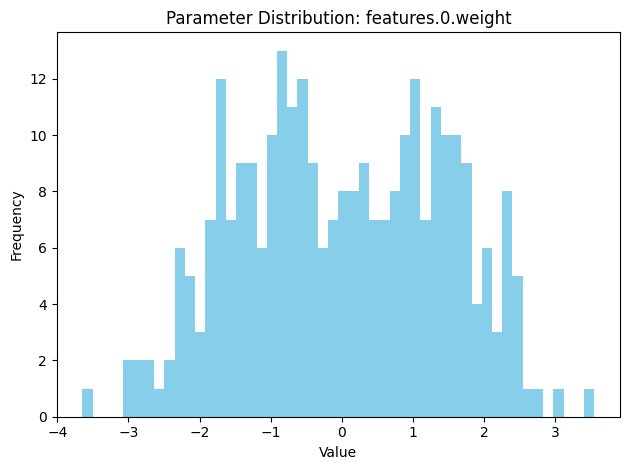

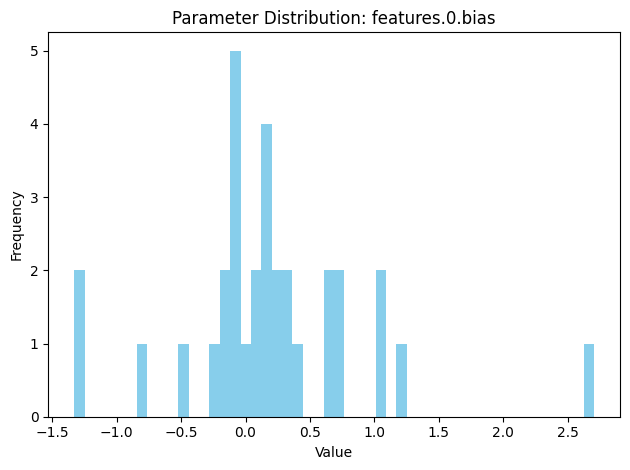

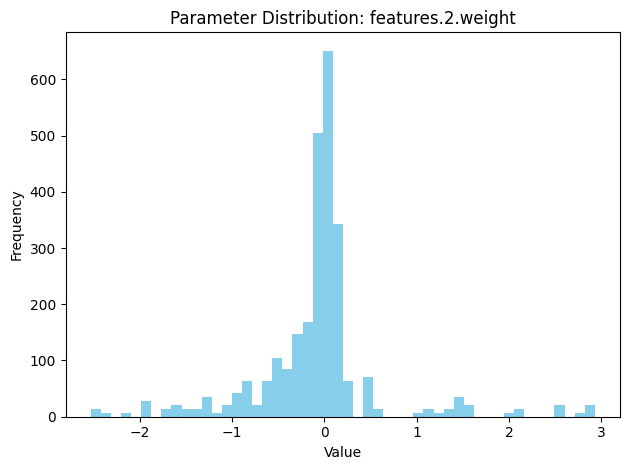

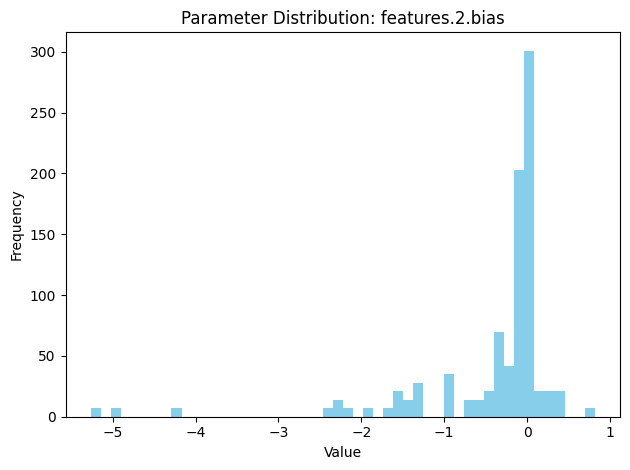

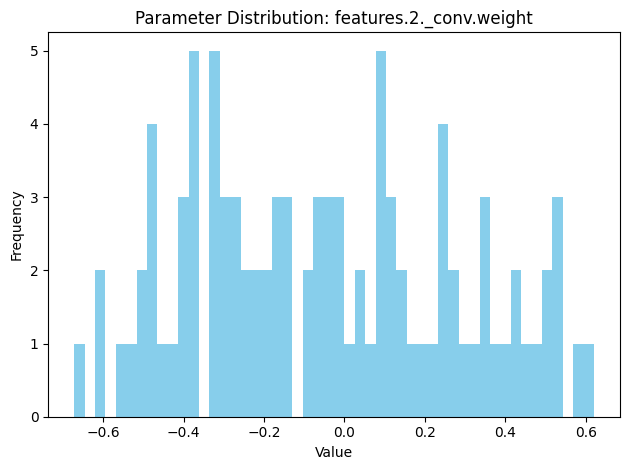

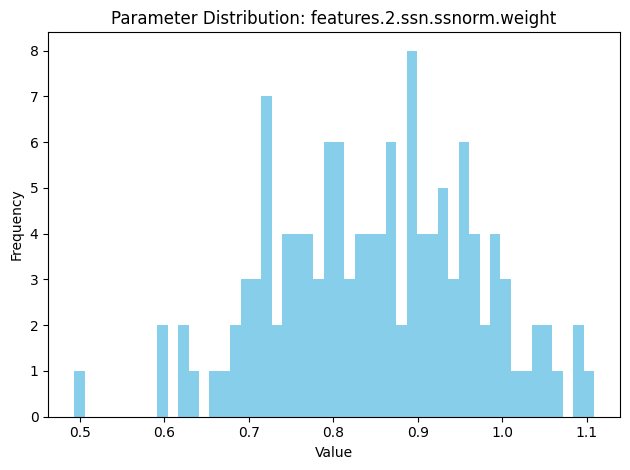

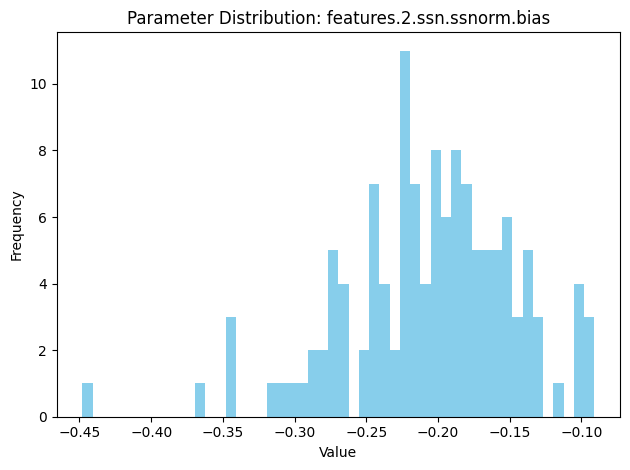

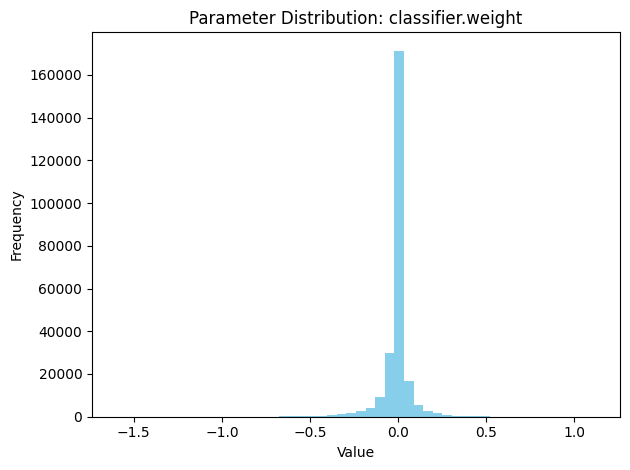

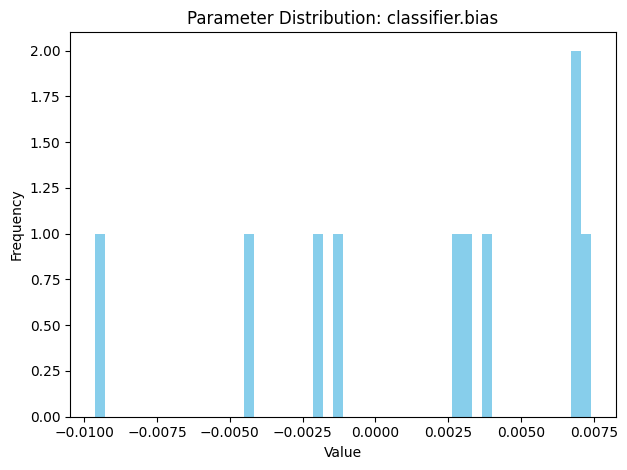

In [ ]:
# Example setup:
import torch



import matplotlib.pyplot as plt
import numpy as np

for name, param in fused_model.named_parameters():
    if not param.requires_grad:
        continue

    # pull out the data as a flat numpy array
    data = param.detach().cpu().numpy().flatten()

    # mask out any NaNs
    data = data[~np.isnan(data)]

    # if after masking there's nothing left, skip
    if data.size == 0:
        continue

    # now plot
    plt.figure()
    plt.hist(data, bins=50, color='skyblue')
    plt.title(f'Parameter Distribution: {name}')
    plt.xlabel('Value')
    plt.ylabel('Frequency')
    plt.tight_layout()
    plt.show()


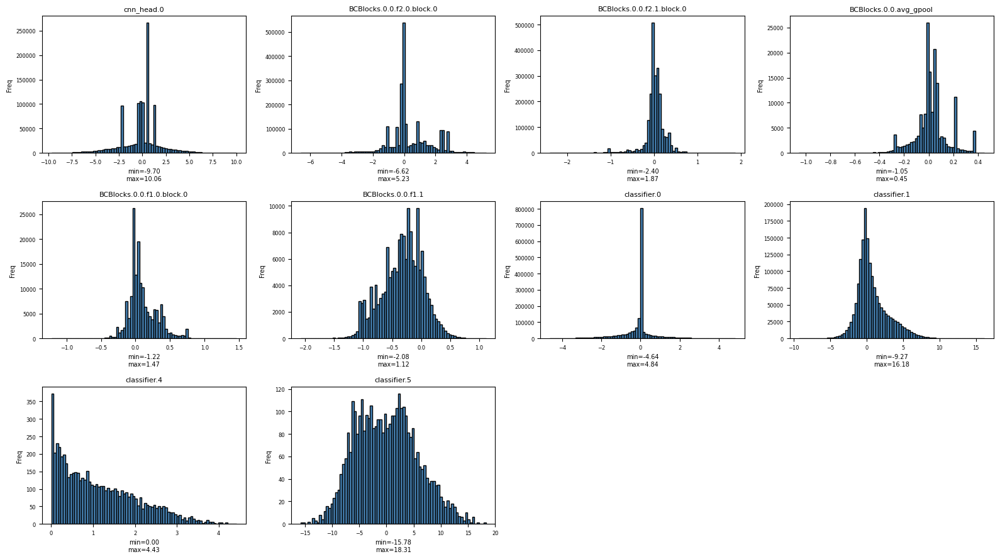

In [ ]:
import torch
import matplotlib.pyplot as plt
import math

def plot_activation_histograms_subplots(input_activation, bins=100, cols=4):
    layer_names = list(input_activation.keys())
    n_layers = len(layer_names)
    rows = math.ceil(n_layers / cols)

    fig, axes = plt.subplots(rows, cols, figsize=(cols * 4, rows * 3))
    axes = axes.flatten()  # 2D 배열을 1D로 펴기

    for idx, layer_name in enumerate(layer_names):
        activation = input_activation[layer_name]
        flat_values = activation.flatten().cpu().detach().numpy()
        min_val = flat_values.min()
        max_val = flat_values.max()

        ax = axes[idx]
        ax.hist(flat_values, bins=bins, color='steelblue', edgecolor='black')
        ax.set_title(layer_name, fontsize=8)
        ax.set_xlabel(f"min={min_val:.2f}\nmax={max_val:.2f}", fontsize=7)
        ax.set_ylabel("Freq", fontsize=7)
        ax.tick_params(axis='both', which='major', labelsize=6)

    # 나머지 빈 subplot은 숨김
    for j in range(idx + 1, len(axes)):
        fig.delaxes(axes[j])

    plt.tight_layout()
    plt.show()
plot_activation_histograms_subplots(output_activation, bins=80, cols=4)


In [ ]:
fused_model

BCResNets(
  (cnn_head): Sequential(
    (0): Conv2d(1, 8, kernel_size=(5, 5), stride=(2, 1), padding=(2, 2))
    (2): PACTActivation()
  )
  (BCBlocks): ModuleList(
    (0): ModuleList(
      (0): BCResBlock(
        (f2): Sequential(
          (0): ConvBNReLU(
            (block): Sequential(
              (0): Conv2d(8, 16, kernel_size=(1, 1), stride=(1, 1))
              (2): PACTActivation()
            )
          )
          (1): ConvBNReLU(
            (block): Sequential(
              (0): CustomConv2d(
                (conv): None
                (_conv): Conv2d(16, 16, kernel_size=(3, 1), stride=(1, 1), padding=(1, 0), groups=16, bias=False)
                (ssn): SubSpectralNorm(
                  (ssnorm): BatchNorm2d(80, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
                )
              )
            )
          )
        )
        (avg_gpool): AdaptiveAvgPool2d(output_size=(1, None))
        (f1): Sequential(
          (0): ConvBNReLU(
     

In [ ]:
y = torch.load('MNIST_fp_input.pt')
print(y)

tensor([[[0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000,
          0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000,
          0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000,
          0.0000, 0.0000, 0.0000, 0.0000],
         [0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000,
          0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000,
          0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000,
          0.0000, 0.0000, 0.0000, 0.0000],
         [0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000,
          0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000,
          0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000,
          0.0000, 0.0000, 0.0000, 0.0000],
         [0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000,
          0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000,
          0.0000, 0.1098, 0.2627, 0.9490, 0.9961, 1.0000,

In [ ]:
x = torch.load('act_Conv2d_fp_1.pt')
print(x)

tensor([[[    -0.2715,     -0.2715,     -0.2715,     -0.2715,     -0.2715,
              -0.2715,     -0.2715,     -0.2715,     -0.2715,     -0.2715,
              -0.2715,     -0.2715,     -0.2715,     -0.2715,     -0.2715,
              -0.2715,     -0.2715,     -0.2715,     -0.2715,     -0.2715,
              -0.2715,     -0.2715,     -0.2715,     -0.2715,     -0.2715,
              -0.2715,     -0.2715,     -0.2715],
         [    -0.2715,     -0.2715,     -0.2715,     -0.2715,     -0.2715,
              -0.2715,     -0.2715,     -0.2715,     -0.2715,     -0.2715,
              -0.2715,     -0.2715,     -0.2715,     -0.2715,     -0.2715,
              -0.2715,     -0.2715,     -0.2715,     -0.2715,     -0.2715,
              -0.2715,     -0.2715,     -0.2715,     -0.2715,     -0.2715,
              -0.2715,     -0.2715,     -0.2715],
         [    -0.2715,     -0.2715,     -0.2715,     -0.2715,     -0.2715,
              -0.2715,     -0.2715,     -0.2715,     -0.2715,     -0.2715,


In [ ]:
fused_model

BCResNets(
  (cnn_head): Sequential(
    (0): Conv2d(1, 8, kernel_size=(5, 5), stride=(2, 1), padding=(2, 2))
    (2): PACTActivation()
  )
  (BCBlocks): ModuleList(
    (0): ModuleList(
      (0): BCResBlock(
        (f2): Sequential(
          (0): ConvBNReLU(
            (block): Sequential(
              (0): Conv2d(8, 16, kernel_size=(1, 1), stride=(1, 1))
              (2): PACTActivation()
            )
          )
          (1): ConvBNReLU(
            (block): Sequential(
              (0): CustomConv2d(
                (conv): None
                (_conv): Conv2d(16, 16, kernel_size=(3, 1), stride=(1, 1), padding=(1, 0), groups=16, bias=False)
                (ssn): SubSpectralNorm(
                  (ssnorm): BatchNorm2d(80, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
                )
              )
            )
          )
        )
        (avg_gpool): AdaptiveAvgPool2d(output_size=(1, None))
        (f1): Sequential(
          (0): ConvBNReLU(
     

In [ ]:
model.BCBlocks[0][0].f1[0].block[0]

Conv2d(16, 16, kernel_size=(1, 3), stride=(1, 1), padding=(0, 1), groups=16, bias=False)

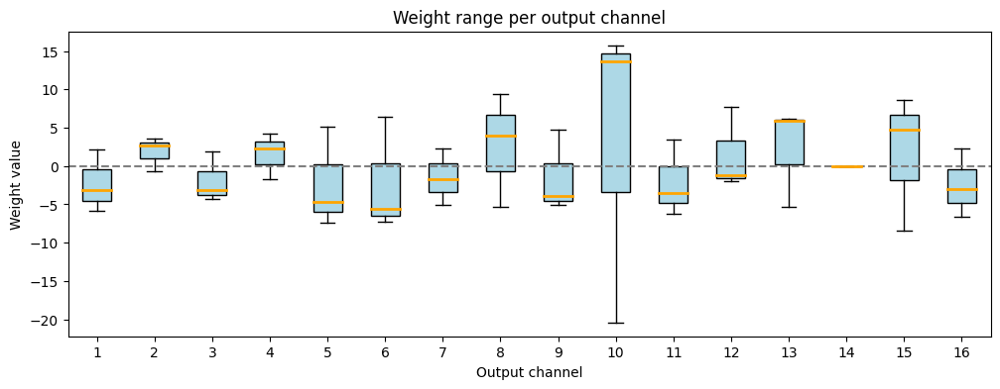

<Figure size 400x400 with 0 Axes>

In [ ]:
import torch
import numpy as np
import matplotlib.pyplot as plt

# ───────────────────────────────────────────────
# 1) weights 가져오기 (예: model.conv.weight)
# ───────────────────────────────────────────────
# 예시: model.conv 가 nn.Conv2d 레이어라고 가정
# weights: torch.Tensor of shape [out_ch, in_ch, kH, kW]
weights = fused_model.BCBlocks[0][0].f1[0].block[0].weight.data.cpu().numpy()

# ───────────────────────────────────────────────
# 2) 채널별로 flatten → 리스트 생성
# ───────────────────────────────────────────────
# data_list[i] 는 i 번째 output channel 의 모든 가중치 값들
data_list = [weights[i].flatten() for i in range(weights.shape[0])]

# ───────────────────────────────────────────────
# 3) Boxplot 그리기
# ───────────────────────────────────────────────
plt.figure(figsize=(12, 4))

# boxplot: positions를 1부터 시작하도록 설정
box = plt.boxplot(
    data_list,
    positions=np.arange(1, weights.shape[0] + 1),
    patch_artist=True,
    medianprops=dict(color='orange', linewidth=2),
    boxprops=dict(facecolor='lightblue', edgecolor='black'),
    whiskerprops=dict(color='black'),
    capprops=dict(color='black'),
    flierprops=dict(marker='o', markeredgecolor='gray', alpha=0.5)
)

# 0 기준선
plt.axhline(0, linestyle='--', color='gray')

# 축 레이블 및 타이틀
plt.title('Weight range per output channel')
plt.xlabel('Output channel')
plt.ylabel('Weight value')

# x축 ticks
plt.xticks(np.arange(1, weights.shape[0] + 1))
plt.figure(figsize=(4, 4))
plt.tight_layout()
plt.show()


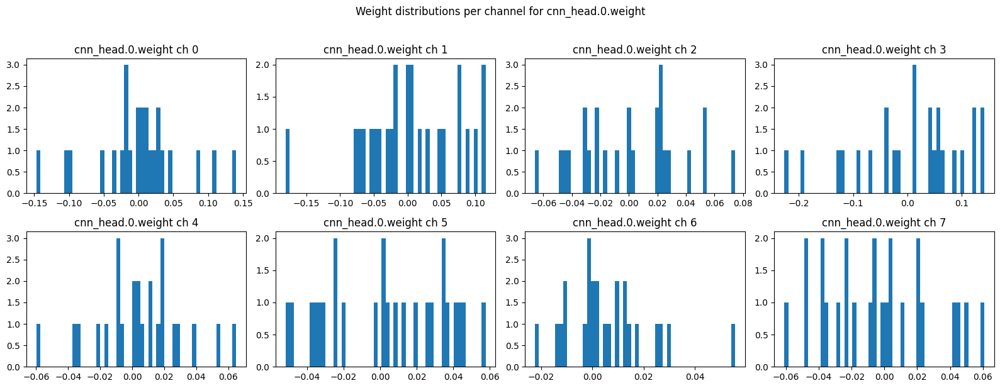

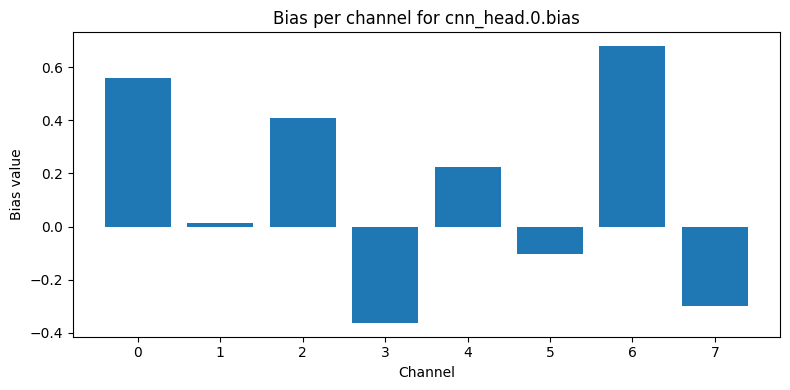

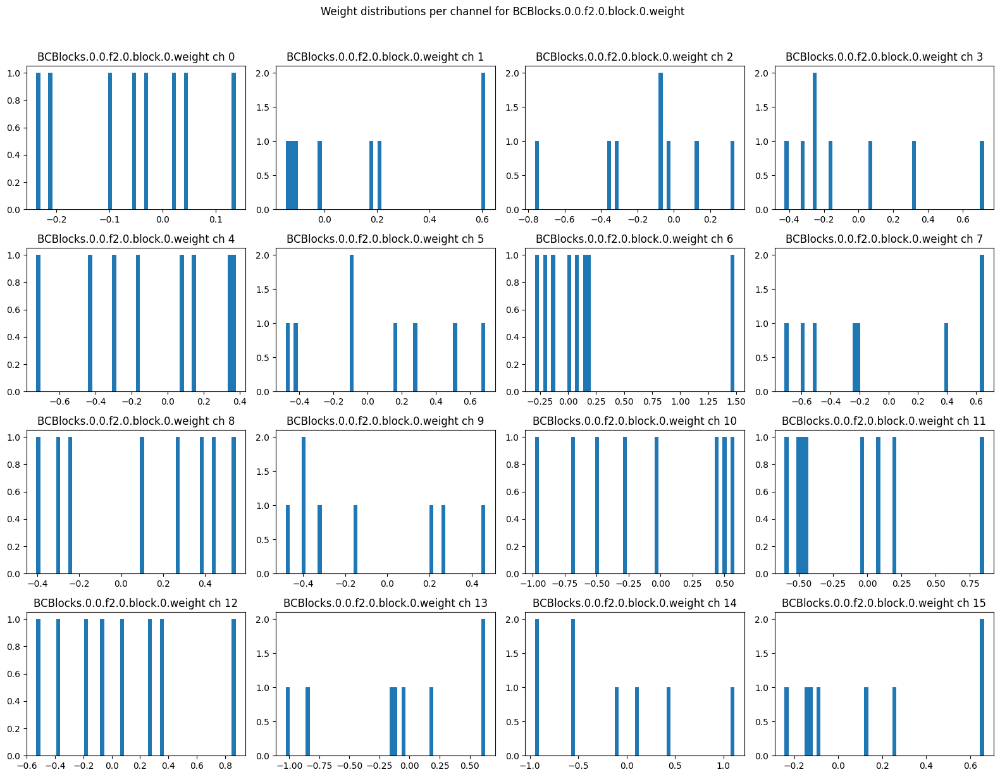

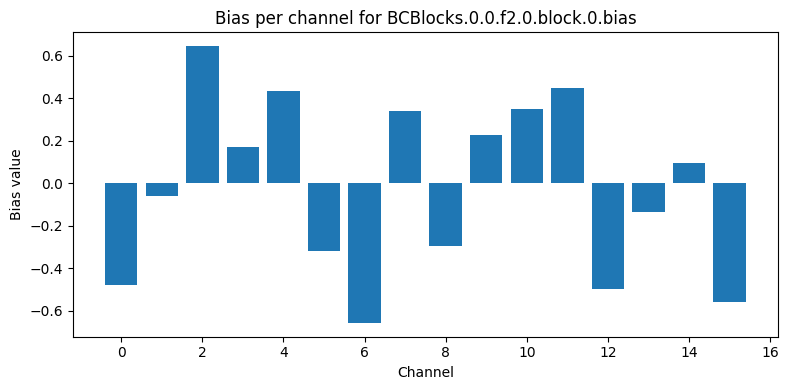

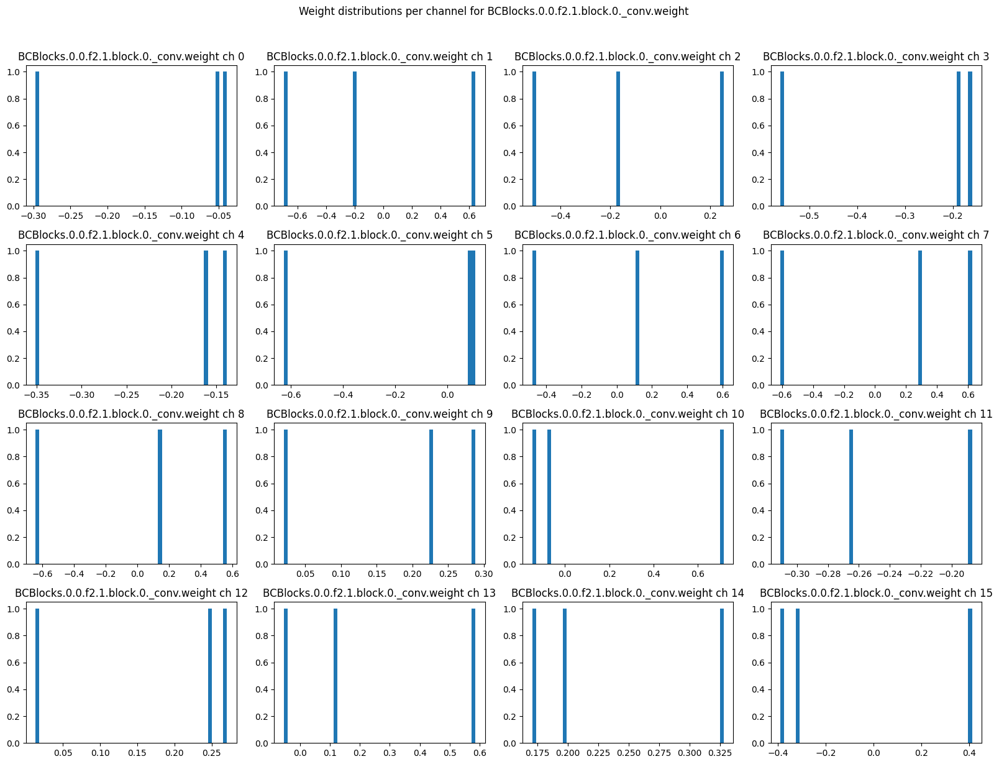

...

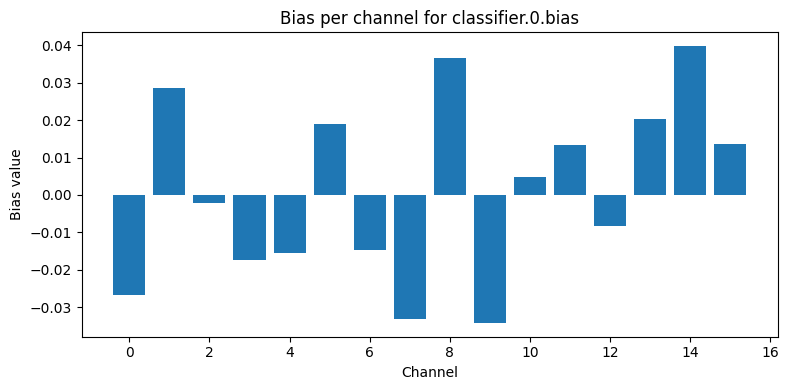

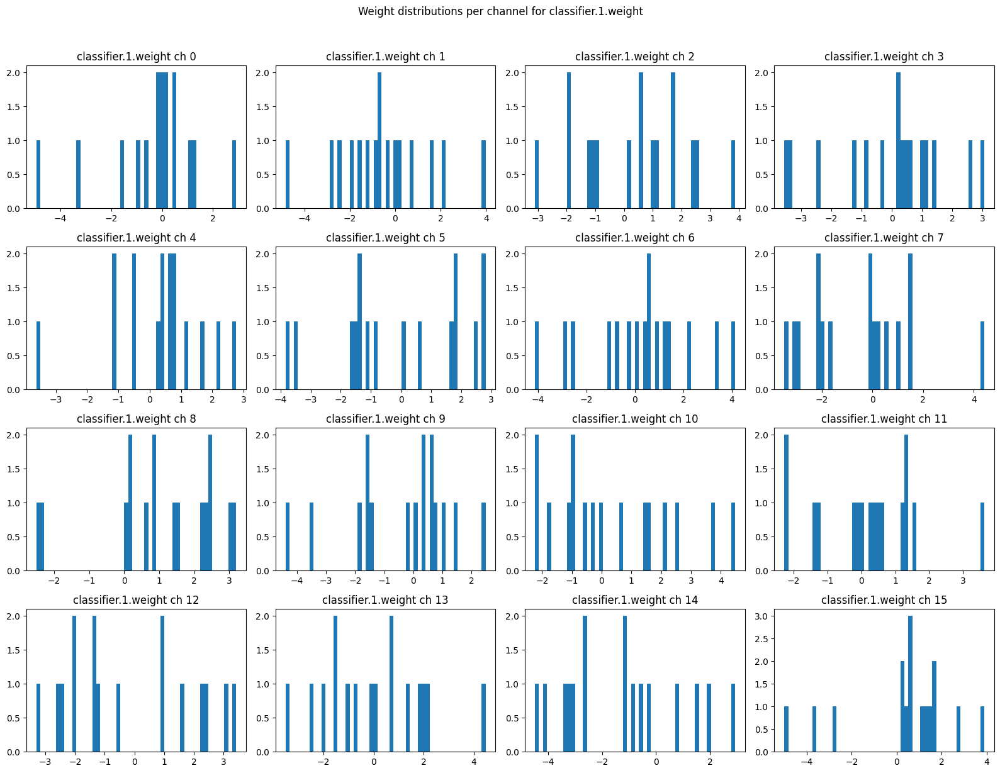

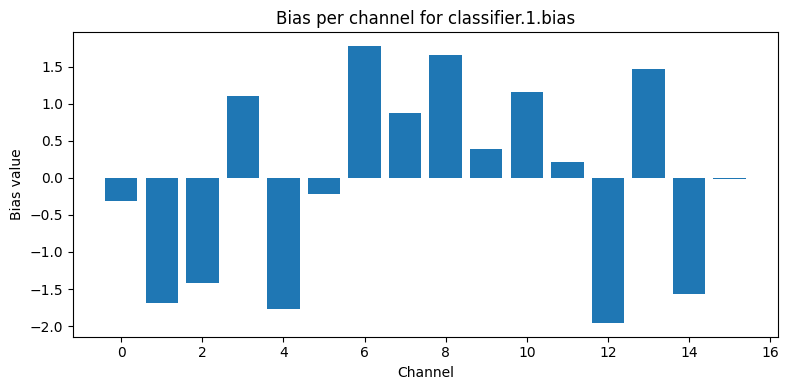

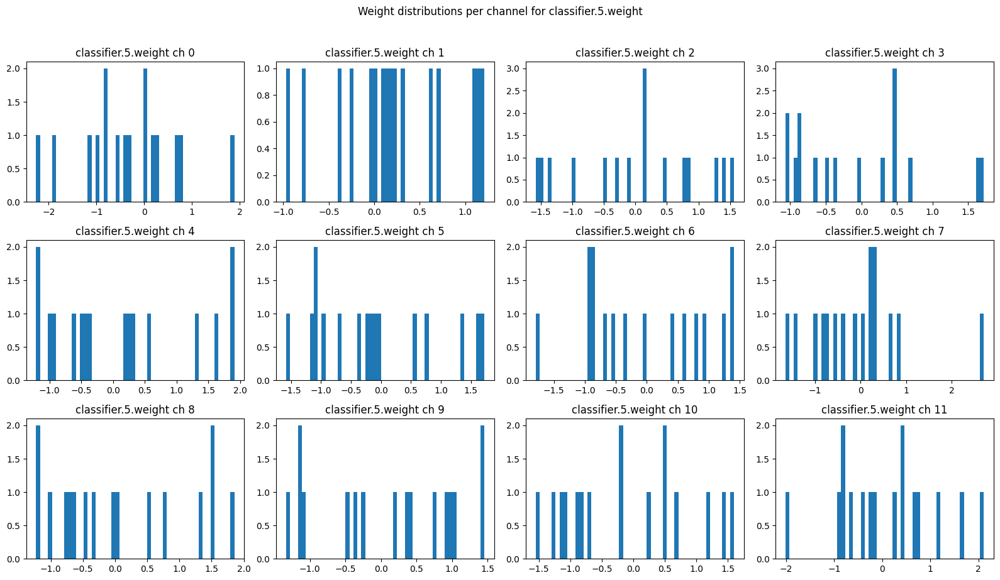

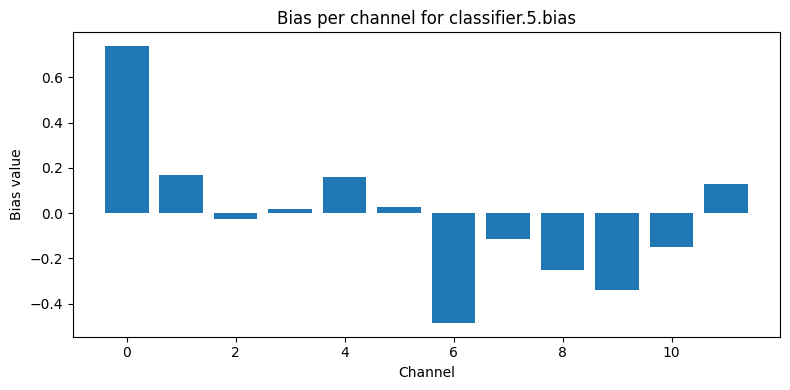

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Pre-extract weights/biases from fused_model into dicts:
conv_weights = {}
conv_biases = {}
for name, param in fused_model.state_dict().items():
    if 'weight' in name and param.ndim == 4:  # conv weight: (out_ch, in_ch, kh, kw)
        conv_weights[name] = param.cpu().numpy()
    if 'bias' in name and param.ndim == 1:   # bias: (out_ch,)
        conv_biases[name] = param.cpu().numpy()

for name, weight in conv_weights.items():
    out_ch = weight.shape[0]
    n_cols = 4
    n_rows = int(np.ceil(out_ch / n_cols))
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(n_cols*4, n_rows*3))
    axes = axes.flatten()
    for idx in range(out_ch):
        data = weight[idx].flatten()
        data = data[~np.isnan(data)]
        axes[idx].hist(data, bins=50)
        axes[idx].set_title(f'{name} ch {idx}')
    for ax in axes[out_ch:]:
        ax.axis('off')
    fig.suptitle(f'Weight distributions per channel for {name}', y=1.02)
    plt.tight_layout()
    plt.show()

    # Plot bias if available
    bias_name = name.replace('weight', 'bias')
    if bias_name in conv_biases:
        bias = conv_biases[bias_name]
        plt.figure(figsize=(8, 4))
        plt.bar(np.arange(len(bias)), bias)
        plt.title(f'Bias per channel for {bias_name}')
        plt.xlabel('Channel')
        plt.ylabel('Bias value')
        plt.tight_layout()
        plt.show()


In [ ]:
print(

SyntaxError: unexpected EOF while parsing (149104261.py, line 1)

In [ ]:
import torch
import matplotlib.pyplot as plt

def plot_model_weights_histograms(model):
    """
    Plots histograms of all weights and biases in the model.
    Also prints the min and max values of each parameter.
    """
    params = list(model.named_parameters())
    num_params = len(params)

    cols = 2
    rows = (num_params + 1) // cols
    fig, axes = plt.subplots(rows, cols, figsize=(12, rows * 3))
    axes = axes.flatten()

    for idx, (name, param) in enumerate(params):
        if param.requires_grad:
            data = param.detach().cpu().numpy().flatten()
            min_val = data.min()
            max_val = data.max()
            print(f"{name}: min = {min_val:.6f}, max = {max_val:.6f}")

            axes[idx].hist(data, bins=50)
            axes[idx].set_title(f"{name}\nmin={min_val:.2e}, max={max_val:.2e}")
            axes[idx].set_xlabel('Value')
            axes[idx].set_ylabel('Frequency')

    for i in range(len(params), len(axes)):
        axes[i].axis('off')

    plt.tight_layout()
    plt.show()


features.0.weight: min = -1.494044, max = 1.271680
features.0.bias: min = -0.141314, max = 0.229742
features.2.weight: min = -3.183081, max = 2.961354
features.2.bias: min = -0.553696, max = 0.440654
features.2._conv.weight: min = -0.672053, max = 0.620528
features.2.ssn.ssnorm.weight: min = 0.493320, max = 1.108710
features.2.ssn.ssnorm.bias: min = -0.447881, max = -0.090993
classifier.weight: min = -0.178122, max = 0.152880
classifier.bias: min = -0.009630, max = 0.007406


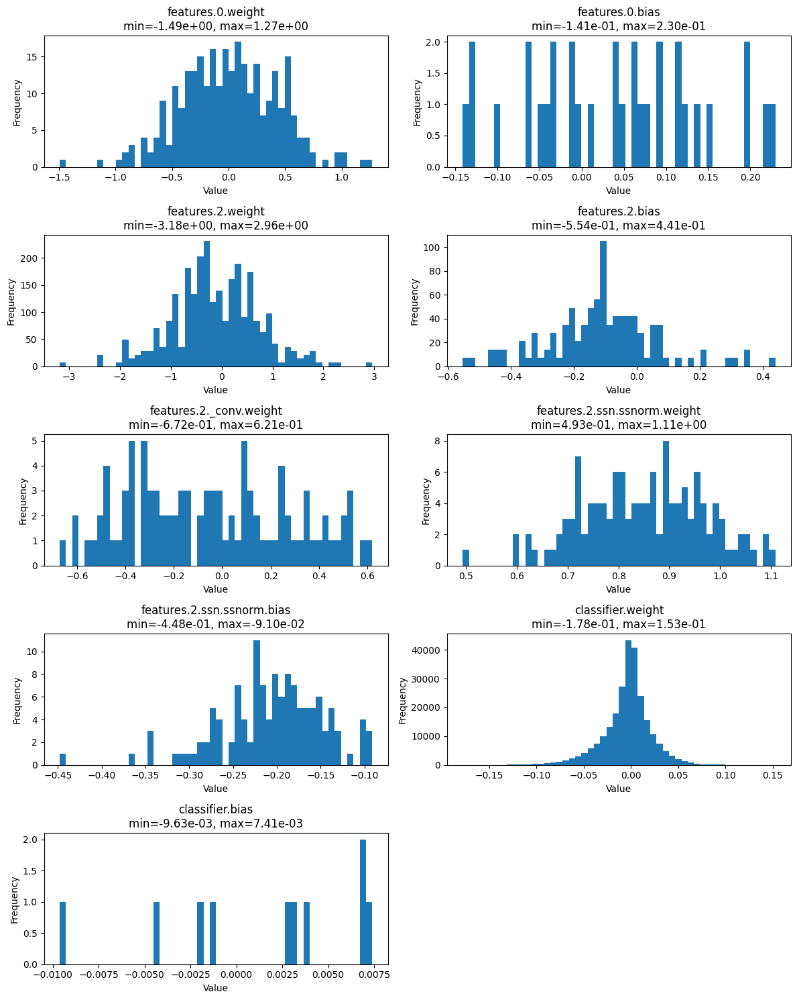

In [ ]:
plot_model_weights_histograms(fused_model)

In [ ]:
print(

SyntaxError: unexpected EOF while parsing (149104261.py, line 1)

In [ ]:
# 모델의 모든 모듈을 순회하며 hook 등록 여부를 출력
for name, module in fused_model.named_modules():
    fwd_hooks = module._forward_hooks
    pre_hooks = module._forward_pre_hooks
    bwd_hooks = module._backward_hooks
    if fwd_hooks or pre_hooks or bwd_hooks:
        print(f"Module: {name}")
        if fwd_hooks:
            print(f"  Forward hooks: {list(fwd_hooks.keys())}")
        if pre_hooks:
            print(f"  Forward-pre hooks: {list(pre_hooks.keys())}")
        if bwd_hooks:
            print(f"  Backward hooks: {list(bwd_hooks.keys())}")

# 필요 없다면 hook 제거


In [ ]:
fused_model

In [ ]:
import torch
import torch.nn as nn
from datetime import datetime

def print_output_hook(module, inputs, outputs):
    """
    A forward hook that prints the module name and its output activations.
    """
    print(f"\n--- Inside {module.__class__.__name__} (output) ---")
    # outputs가 Tensor일 수도, tuple일 수도 있으니 일관적으로 tuple로 변환
    outs = outputs if isinstance(outputs, (tuple, list)) else (outputs,)
    for idx, outp in enumerate(outs):
        t = outp.detach().cpu()
        print(f" output[{idx}].shape: {tuple(t.shape)}")
        print(f" output[{idx}]:\n{t}\n")
        timestamp = datetime.now().strftime("%B%d_%H%M%S")
        torch.save(t, f"output_{module.__class__.__name__}_{timestamp}.pt")

# 예: fused_model이 이미 정의되어 있다고 가정
for name, module in fused_model.named_modules():
    # Conv2d 레이어에만 훅을 달아줍니다
    if isinstance(module, (nn.Conv2d, nn.ReLU)):
        module.register_forward_hook(print_output_hook)

# 더미 입력 예시
dummy_input = torch.load('label_input_40,101.pt')[1][1].to('cuda')

# Forward pass: Conv2d 출력마다 훅이 실행됩니다
out = fused_model(dummy_input)



--- Inside Conv2d (output) ---
 output[0].shape: (8, 20, 101)
 output[0]:
tensor([[[ 0.7821,  0.7049,  0.4635,  0.4821,  0.5099,  0.5093,  0.5018,
           0.5013,  0.4925,  0.4950,  0.4883,  0.4791,  0.4854,  0.4952,
           0.4947,  0.5014,  0.4915,  0.4872,  0.4886,  0.4884,  0.4886,
           0.4874,  0.4857,  0.4845,  0.4855,  0.4846,  0.4874,  0.4877,
           0.4881,  0.4881,  0.4863,  0.4858,  0.4847,  0.4694,  0.4583,
           0.4821,  0.4929,  0.4927,  0.4852,  0.4517,  0.4632,  0.4941,
           0.5072,  0.5205,  0.5112,  0.4949,  0.4922,  0.4902,  0.4889,
           0.4885,  0.4908,  0.4840,  0.4878,  0.4849,  0.4865,  0.4886,
           0.4879,  0.4888,  0.4882,  0.4864,  0.4829,  0.4869,  0.4831,
           0.4839,  0.4826,  0.4829,  0.4663,  0.3942,  0.3303,  0.3933,
           0.5192,  0.6189,  0.6489,  0.5716,  0.4980,  0.4675,  0.4368,
           0.3883,  0.4407,  0.5147,  0.5538,  0.5836,  0.5252,  0.4928,
           0.4916,  0.3618,  0.1567,  0.2370,  0.

IndexError: tuple index out of range

In [ ]:
print(

In [ ]:
class SubSpectralNorm(nn.Module):
    def __init__(self, num_features, spec_groups=16, affine="Sub", batch=True, dim=2):
        super().__init__()
        self.spec_groups = spec_groups
        self.affine_all = False
        affine_norm = False
        if (
            affine == "Sub"
        ):  # affine transform for each sub group. use affine of torch implementation
            affine_norm = True
        elif affine == "All":
            self.affine_all = True
            self.weight = nn.Parameter(torch.ones((1, num_features, 1, 1)))
            self.bias = nn.Parameter(torch.zeros((1, num_features, 1, 1)))
        if batch:
            self.ssnorm = nn.BatchNorm2d(num_features * spec_groups, affine=affine_norm)
        else:
            self.ssnorm = nn.InstanceNorm2d(num_features * spec_groups, affine=affine_norm)
        self.sub_dim = dim

    def forward(self, x):  # when dim h is frequency dimension
        if self.sub_dim in (3, -1):
            x = x.transpose(2, 3)
            x = x.contiguous()
        b, c, h, w = x.size()
        assert h % self.spec_groups == 0
        x = x.view(b, c * self.spec_groups, h // self.spec_groups, w)
        x = self.ssnorm(x)
        x = x.view(b, c, h, w)
        if self.affine_all:
            x = x * self.weight + self.bias
        if self.sub_dim in (3, -1):
            x = x.transpose(2, 3)
            x = x.contiguous()
        return x

In [ ]:
### May 10, 2025 ###

### Verficiation of the modules ###

# QuantizedConv2d
# QuantizedCustomConv2d
# QuantizedAdaptiveAvgPool2d
# QuantizedCustomReLU

### The Verification of the modules are proceeded as follows:
# 1. generate a random input tensor and quantize & dequantize it
# 2. initialize the simple_q_model and simple_f_model sharing same parameters 
# 3. pass the quantized & dequantized input tensor through the module (to both simple_q_model and simple_f_model)
# 4. compare the output tensor of simple_q_model with the quantized output tensor of simple_f_model

In [ ]:
conv = nn.Conv2d(8, 8, (3, 1), stride=(1, 1), padding=(1, 0), groups=8, bias=True)
torch.save(conv.state_dict(), "conv_params_with_bias.pth")

In [ ]:
## The following code is a verification of the QuantizedConv2d module.

conv = nn.Conv2d(8, 8, (3, 1), stride=(1, 1), padding=(1, 0), groups=8, bias=True)
conv_params = torch.load('conv_params_with_bias.pth')

class simple_fused_model(nn.Module):
    def __init__(self, convolution, param):
        super().__init__()
        convolution.load_state_dict(param)
        self.model = nn.Sequential(convolution)

    def forward(self, x):
        return self.model(x)

x=torch.load('input1.pt')
quantized, dequantized, input_scale, input_zero_point=quantize_and_dequantize(x, 8)
simple_f_model = simple_fused_model(conv, conv_params)
simple_f_model = simple_f_model.to('cuda')
simple_f_model.eval()

y=simple_f_model(dequantized)
print('simple f model')
y_quantized, _, output_scale, output_zero_point =quantize_and_dequantize(y, 8)
torch.save(y_quantized, 'output_f_conv2d_with_bias.pt')

input_activation = {}
output_activation = {}
input_activation["0"]=x
output_activation["0"]=y

class simple_quantized_model(nn.Module):
    def __init__(self, convolution, param, input_activation, output_activation, bitwidth=8):
        super().__init__()
        feature_bitwidth = weight_bitwidth = bitwidth
        convolution.load_state_dict(param)
        
        weight = convolution.weight.data
        bias = convolution.bias.data if convolution.bias is not None else None
        quantized_weight, shifted_quantized_bias, input_scale, input_zero_point, output_scale, output_zero_point, weight_scale=\
        get_quantized_weight_scale_zeropoint(
        input_activation["0"],   # 1
        output_activation["0"],       # 2
        weight,                             # 3
        bias,                               # 4
        feature_bitwidth,                   # 5
        weight_bitwidth,                    # 6
        'conv2d',                           # 7 → layer_type
        None,                               # 8 → oh
        None                         # 9 → spec_group
    )
        stride = convolution.stride
        padding = convolution.padding
        dilation = convolution.dilation
        groups = convolution.groups
        
        # Replace Conv2d with QuantizedConv2d
        self.model = nn.Sequential( QuantizedConv2d(quantized_weight, shifted_quantized_bias, input_zero_point, output_zero_point,
                                                input_scale, weight_scale, output_scale,
                                                stride, padding, dilation, groups, 
                                                feature_bitwidth, weight_bitwidth))
        print(f'Replaced Conv2d with QuantizedConv2d at layer')
        print(f"quantized with weight scale: {weight_scale}, input scale: {input_scale}, output scale: {output_scale}")
        print(f'quantized with input zero point: {input_zero_point}, output zero point: {output_zero_point}')
                
        
    def forward(self, x):
        return self.model(x)
    

simple_q_model = simple_quantized_model(conv, conv_params, input_activation, output_activation, bitwidth=8)
simple_q_model = simple_q_model.to('cuda')
simple_q_model.eval()
y2=simple_q_model(quantized)
print('simple q model')
torch.save(y2, 'output_q_conv2d_with_bias.pt')

In [ ]:
## The following code is a verification of the QuantizedCustomConv2d module.

conv = nn.Conv2d(8, 8, (3, 1), stride=(1, 1), padding=(1, 0), groups=8, bias=False)
ssn = SubSpectralNorm(8, spec_groups=5, affine="Sub", batch=True, dim=2)
customconv_weight = torch.load('customconv2d_weight.pth')
customconv_bias = torch.load('customconv2d_bias.pth')
customconv_params = { 'weight': customconv_weight, 'bias': customconv_bias }

class simple_fused_model(nn.Module):
    def __init__(self, convolution, ssnorm, params):
        super().__init__()
      
        customconv2d = CustomConv2d(convolution, ssnorm)
        customconv2d.weight = params['weight']
        customconv2d.bias = params['bias']
        self.model = nn.Sequential(customconv2d)

    def forward(self, x):
        return self.model(x)

x=torch.load('input1.pt')
quantized, dequantized, input_scale, input_zero_point=quantize_and_dequantize(x, 8)
simple_f_model2 = simple_fused_model(conv, ssn, customconv_params) 
simple_f_model2 = simple_f_model2.to('cuda')
simple_f_model2.eval()
y=simple_f_model2(dequantized)
print('simple f model')
y_quantized, _, output_scale, output_zero_point =quantize_and_dequantize(y, 8)

input_activation = {}
output_activation = {}
input_activation["0"]=x
output_activation["0"]=y

class simple_quantized_model(nn.Module):
    def __init__(self, customconv2d, params, input_activation, output_activation, bitwidth=8):
        super().__init__()
        feature_bitwidth = weight_bitwidth = bitwidth
        customconv2d.weight = params['weight']
        customconv2d.bias = params['bias']
        oh=customconv2d.output_dim[2]
        spec_groups=customconv2d.spec_groups
        
        weight=customconv2d.weight.data
        bias = customconv2d.bias.data 
        
        quantized_weight, shifted_quantized_bias, input_scale, input_zero_point, output_scale, output_zero_point, weight_scale=\
        get_quantized_weight_scale_zeropoint(
        input_activation["0"],   # 1
        output_activation["0"],       # 2
        weight,                             # 3
        bias,                               # 4
        feature_bitwidth,                   # 5
        weight_bitwidth,                    # 6
        'customconv2d',                           # 7 → layer_type
        oh,                               # 8 → oh
        spec_groups                         # 9 → spec_group
    )
        conv=customconv2d._conv
        ssn=customconv2d.ssn

        self.model = nn.Sequential(QuantizedCustomConv2d(conv, ssn, quantized_weight, shifted_quantized_bias,
            input_zero_point, output_zero_point,
            input_scale, weight_scale, output_scale,
            feature_bitwidth, weight_bitwidth))

        
        
        print(f'Replaced Conv2d with QuantizedCustomConv2d at layer')
        print(f"quantized with weight scale: {weight_scale}, input scale: {input_scale}, output scale: {output_scale}")
        print(f'quantized with input zero point: {input_zero_point}, output zero point: {output_zero_point}')
                
        
    def forward(self, x):
        return self.model(x)
    

simple_q_model2 = simple_quantized_model(simple_f_model2.model[0], customconv_params, input_activation, output_activation, bitwidth=8)
simple_q_model2 = simple_q_model2.to('cuda')
print(quantized.shape)
y2=simple_q_model2(quantized)
print('simple q model')
print(y2)

In [ ]:
## The following code is a verification of the QuantizedAdaptiveAvgPool2d module.


avg_gpool = nn.AdaptiveAvgPool2d(output_size=(1, None))

class simple_fused_model(nn.Module):
    def __init__(self,):
        super().__init__()
      
        avg_gpool = nn.AdaptiveAvgPool2d(output_size=(1, None))
        self.model = nn.Sequential(avg_gpool)
        
    def forward(self, x):
        return self.model(x)

x=torch.load('input1.pt')
quantized, dequantized, _, _=quantize_and_dequantize(x, 8)
simple_f_model3 = simple_fused_model() 
simple_f_model3 = simple_f_model3.to('cuda')
simple_f_model3.eval()
y=simple_f_model3(dequantized)
print('simple f model')
y_quantized, _, _, _ =quantize_and_dequantize(y, 8)
print("input", dequantized.shape, "output", y_quantized.shape)
print(y_quantized)
torch.save(y_quantized, 'output_f_avgpool2d.pt')
input_activation = {}
output_activation = {}
input_activation["0"]=x
output_activation["0"]=y

class simple_quantized_model(nn.Module):
    def __init__(self, avg_pool, input_activation, output_activation, bitwidth=8):
        super().__init__()
        feature_bitwidth = bitwidth
        input_scale, input_zero_point = get_quantization_scale_and_zero_point(
        input_activation["0"], feature_bitwidth)
        output_scale, output_zero_point = get_quantization_scale_and_zero_point(
            output_activation["0"], feature_bitwidth)
        self.model =nn.Sequential( QuantizedAdaptiveAvgPool2d(avg_pool.output_size, input_scale, input_zero_point, output_scale, output_zero_point))
        
        print(f'Replaced AdaptiveAvgPool2d with QuantizedAdaptiveAvgPool2d at layer')
                
        
    def forward(self, x):
        return self.model(x)
    

simple_q_model3 = simple_quantized_model(simple_f_model3.model[0], input_activation, output_activation)
simple_q_model3 = simple_q_model3.to('cuda')
y2=simple_q_model3(quantized)
print('simple q model')
print("input", quantized.shape, "output", y2.shape)
print(y2)
torch.save(y2, 'output_q_avgpool2d.pt')
             
             

In [ ]:
simple_f_model4.model[0]

In [ ]:
input_activation

In [ ]:
## The following code is a verification of the QuantizedCustomReLU module.



class simple_fused_model(nn.Module):
    def __init__(self,):
        super().__init__()
      
        self.model = nn.Sequential(nn.ReLU())
        
    def forward(self, x):
        return self.model(x)

x=torch.load('input1.pt')
quantized, dequantized, _, _=quantize_and_dequantize(x, 8)
simple_f_model4 = simple_fused_model() 
simple_f_model4 = simple_f_model4.to('cuda')
simple_f_model4.eval()
y=simple_f_model4(dequantized)
print('simple f model')
y_quantized, _, _, _ =quantize_and_dequantize(y, 8)
print("input", dequantized.shape, "output", y_quantized.shape)
print(y_quantized)
torch.save(y_quantized, 'output_f_relu.pt')
input_activation = {}
output_activation = {}
input_activation["0"]=x
output_activation["0"]=y

class simple_quantized_model(nn.Module):
    def __init__(self, input_activation, bitwidth=8):
        super().__init__()
        input_scale, input_zero_point = get_quantization_scale_and_zero_point(input_activation["0"], bitwidth)
        output_scale, output_zero_point = get_quantization_scale_and_zero_point(
            output_activation["0"], bitwidth)
        self.model =nn.Sequential(  QuantizedCustomReLU(input_scale, input_zero_point, output_scale, output_zero_point))
        
        print(f'Replaced ReLU with QuantizedcustomReLU at layer')
                
     
    def forward(self, x):
        return self.model(x)
    

simple_q_model4 = simple_quantized_model(input_activation)
simple_q_model4 = simple_q_model4.to('cuda')
y2=simple_q_model4(quantized)
print('simple q model')
print("input", quantized.shape, "output", y2.shape)
print(y2)
torch.save(y2, 'output_q_relu.pt')
             
             

In [ ]:
class simple_quantized_model(nn.Module):
    def __init__(self, conv):
        super().__init__()
        feature_bitwidth = 8
        weight_bitwidth = 8
        
        weight = conv.weight.data
        bias = conv.bias.data if conv.bias is not None else None

        stride = conv.stride
        padding = conv.padding
        dilation = conv.dilation
        groups = conv.groups
                
        input_activation = torch.randn(8, 8, 40, 101)
        output_activation = torch.randn(8, 8, 40, 101)
        
        input_scale, input_zero_point = get_quantization_scale_and_zero_point(
        input_activation, feature_bitwidth)
        output_scale, output_zero_point = get_quantization_scale_and_zero_point(
            output_activation, feature_bitwidth)
        
        quantized_weight, weight_scale, weight_zero_point = \
        linear_quantize_weight_per_channel(weight, weight_bitwidth)
        quantized_bias, bias_scale, bias_zero_point = \
        linear_quantize_bias_per_output_channel(
            bias, weight_scale, input_scale, oh=40, bitwidth = weight_bitwidth) if bias is not None else (None, None, None)
        shifted_quantized_bias = shift_quantized_conv2d_bias(
        quantized_bias, quantized_weight, input_zero_point) if quantized_bias is not None else None
        
        self.model = nn.Sequential(QuantizedConv2d(quantized_weight, shifted_quantized_bias, input_zero_point, output_zero_point,
                                                        input_scale, weight_scale, output_scale,
                                                        stride, padding, dilation, groups, 
                                                        feature_bitwidth, weight_bitwidth))

    def forward(self, x):
        return self.model(x)
    

simple_q_model = simple_quantized_model(conv)
y2=simple_q_model(quantized)
print('simple q model')
print(y2)

